In [1]:
import os
import json
import pickle
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm

# For data scaling & metrics
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.model_selection import ParameterGrid

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

In [2]:
from dl_models_lib import sliding_window_forecast_with_torch
from dl_models_lib import MLP, CNN, RNN, LSTM, GRU

In [3]:
device = "mps" if torch.mps.is_available() else "cpu"
print("Using device:", device)

Using device: mps


In [4]:
DAILY_PKL     = os.path.join("temp_output", "daily_X_y.pkl")
QUARTERLY_PKL = os.path.join("temp_output", "quarterly_X_y.pkl")
LOG_DIR_DAILY     = "model_dl_logs_d"
LOG_DIR_QUARTERLY = "model_dl_logs_q"
MODEL_TYPES = ['MLP','CNN','RNN','LSTM','GRU']
MODEL_TYPES = ['MLP','RNN','LSTM','GRU']

In [5]:
USE_LOGS = False
if os.path.exists("temp_dl_logs_Daily") and os.listdir("temp_dl_logs_Daily") and \
   os.path.exists("temp_dl_logs_Quarterly") and os.listdir("temp_dl_logs_Quarterly"):
    USE_LOGS = True
    print("[INFO] Pre-existing log files found in both temp_logs_Daily and temp_dl_logs_Quarterly. Skipping re-fitting and using existing logs.")
else:
    print("[INFO] One or both log directories are empty. Proceeding with model fitting.")

[INFO] Pre-existing log files found in both temp_logs_Daily and temp_dl_logs_Quarterly. Skipping re-fitting and using existing logs.


In [6]:
def load_logs(log_dir):
    """Load all CSV log files from a log directory and return one combined DataFrame."""
    files = [os.path.join(log_dir, f) for f in os.listdir(log_dir) if f.endswith(".csv")]
    if not files:
        print(f"[ERROR] No log files found in {log_dir}")
        return pd.DataFrame()
    dfs = [pd.read_csv(f) for f in files]
    return pd.concat(dfs, ignore_index=True)

def get_best_config(logs_df):
    """
    Group by model_name and hyperparameters, average MSE, MAPE, R^2,
    and then select for each model type the configuration with lowest average MAPE.
    Returns a DataFrame with one best row per model type.
    """
    grouped = logs_df.groupby(["model_name", "model_hyperparameters_dict"])[
        ["MSE_score", "MAPE_score", "R^2_score"]
    ].mean().reset_index()
    best_rows = grouped.loc[grouped.groupby("model_name")["MAPE_score"].idxmin()].reset_index(drop=True)
    return best_rows

def get_test_dates_for_log(row, full_df):
    """
    Given one log row and the full DataFrame, reconstruct the dates corresponding
    to the test portion of that sliding window.
    
    If the log's start_date contains 'Q' (quarterly), it is parsed as a Period and converted 
    to its quarter-end Timestamp. Otherwise, the start_date is parsed as a datetime.
    If an exact match isn't found in full_df.index, the nearest index is used.
    """
    start_date_str = row['start_date']
    if "Q" in start_date_str:
        start_period = pd.Period(start_date_str, freq='Q')
        start_date_parsed = start_period.to_timestamp(how='E').normalize()
    else:
        start_date_parsed = pd.to_datetime(start_date_str).normalize()
    try:
        start_idx = full_df.index.get_loc(start_date_parsed)
    except KeyError:
        #print(f"[ERROR] start_date {start_date_parsed} not found in DataFrame index; attempting nearest match.")
        # Use the nearest matching index
        idx_array = full_df.index.get_indexer([start_date_parsed], method='nearest')
        if idx_array[0] == -1:
            print(f"[ERROR] No nearest match found for {start_date_parsed}.")
            return []
        start_idx = idx_array[0]
    window_size = int(row['window_size'])
    test_ratio = float(row['test_ratio'])
    train_size = int(window_size * (1 - test_ratio))
    return full_df.index[start_idx + train_size : start_idx + window_size]

def aggregate_predictions(log_df, full_df):
    """
    Aggregate predictions from sliding-window log DataFrame.
    Returns two dictionaries:
      - first_preds: {test_date: first prediction}
      - all_preds: {test_date: list of predictions}
    """
    first_preds = {}
    all_preds = {}
    for _, row in log_df.iterrows():
        pred_vals = row['test_data_model_predictions_list']
        if isinstance(pred_vals, str):
            pred_vals = json.loads(pred_vals)
        test_dates = get_test_dates_for_log(row, full_df)
        if len(test_dates) != len(pred_vals):
            continue
        first_preds[test_dates[0]] = pred_vals[0]
        for i, d in enumerate(test_dates):
            all_preds.setdefault(d, []).append(pred_vals[i])
    return first_preds, all_preds

def series_from_dict(pred_dict):
    """
    Convert a dictionary of date: prediction into a sorted pandas Series.
    If keys are Periods, convert them to Timestamps using period end.
    """
    dates = list(pred_dict.keys())
    converted_dates = [d.to_timestamp(how='E') if isinstance(d, pd.Period) else pd.to_datetime(d) for d in dates]
    return pd.Series(list(pred_dict.values()), index=pd.DatetimeIndex(converted_dates)).sort_index()

def convert_quarter_index(df):
    """
    Convert a DataFrame's PeriodIndex (or quarter string index) to Timestamps (quarter-end).
    """
    if isinstance(df.index, pd.PeriodIndex):
        return df.index.to_timestamp(how='E')
    else:
        try:
            period_idx = pd.PeriodIndex(df.index, freq='Q')
            return period_idx.to_timestamp(how='E')
        except:
            return pd.to_datetime(df.index)

def compute_performance_metrics(y_true, y_pred):
    """Compute and return MSE, MAPE, and R²."""
    mse = mean_squared_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, mape, r2

In [7]:
def retrain_and_aggregate(
    model_type,
    full_df,
    target_col,
    best_config_row,
    domain_label,
    window_size,
    ticker,
    test_ratio=0.2,
    log_dir="temp_dl_logs"
):
    """
    1) Re-runs sliding_window_forecast_with_torch() with best hyperparams on 'full_df'.
    2) Aggregates predictions with 'aggregate_predictions()'.
    3) Returns the first-prediction Series and the log DataFrame.
    """
    params = json.loads(best_config_row['model_hyperparameters_dict'])
    # We'll do a fresh pass with sliding_window_forecast_with_scaling_dl
    log_df = sliding_window_forecast_with_torch(
        df=full_df,
        target_col=target_col,
        model_name=model_type,
        model_params=params,
        window_size=window_size,
        test_ratio=test_ratio,
        drop_cols=[],
        log_dir=f"temp_dl_logs_{domain_label}",
        log_filename=f"{model_type}_{domain_label}_{ticker}_full.csv"
    )
    # Then parse out the "first predictions" for each window
    first_preds, _ = aggregate_predictions(log_df, full_df)
    pred_series = series_from_dict(first_preds)
    return pred_series, log_df

In [8]:
def load_pickle_data(pkl_path):
    """Load and return data from a pickle file."""
    if not os.path.exists(pkl_path):
        print(f"[ERROR] Pickle file not found: {pkl_path}")
        return {}
    with open(pkl_path, "rb") as f:
        data = pickle.load(f)
    print(f"[SUCCESS] Loaded data from {pkl_path}")
    return data

In [9]:
def final_line_plot(observations, daily_preds, quarterly_preds, model_label):
    """
    Plot final predictions for a given model type:
      - Observations as a steelblue line.
      - Best daily model predictions as a continuous line.
      - Best quarterly model predictions as a connected line with markers.
    For quarterly predictions, we assume the index has been converted to quarter–end dates.
    The markers and lines are drawn with lower alpha and smaller marker size for transparency.
    """
    plt.figure(figsize=(14, 7))
    # Plot true observations (steelblue line with moderate transparency)
    sns.lineplot(x=observations.index, y=observations.values, color='steelblue', label='Observations', 
                 alpha=0.7, lw=2)
    # Plot daily predictions as a continuous line (coral with moderate transparency)
    sns.lineplot(x=daily_preds.index, y=daily_preds.values, color='red', label='Best Daily Prediction', 
                 alpha=0.7, lw=0.5)
    # Plot quarterly predictions as a connected line with markers (forestgreen, lower alpha, smaller markers)
    sns.lineplot(x=quarterly_preds.index, y=quarterly_preds.values, color='forestgreen', label='Best Quarterly Prediction', 
                 alpha=0.5, marker='o', markersize=6)
    plt.title(f"Final Forecast Comparison for {model_label}")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [10]:
def plot_from_temp_logs(ticker, domain_label, model_type, full_df, log_dir="temp_dl_logs"):
    """
    Reads the log file from the `log_dir` for the given ticker and model type,
    aggregates first predictions, and plots forecast comparisons.
    """
    log_filename = f"{model_type}_{domain_label}_{ticker}_full.csv"
    log_dir = f"{log_dir}_{domain_label}"
    log_path = os.path.join(log_dir, log_filename)
    if not os.path.exists(log_path):
        print(f"[ERROR] Log file not found for {ticker} {domain_label} {model_type} at {log_path}")
        return
    log_df = pd.read_csv(log_path)
    first_preds, _ = aggregate_predictions(log_df, full_df)
    pred_series = series_from_dict(first_preds)
    
    if domain_label.lower() == "quarterly":
        obs = full_df["y"]
        obs.index = pd.DatetimeIndex(convert_quarter_index(obs.to_frame()))
    else:
        obs = full_df["y"]
    
    final_line_plot(
        observations=obs,
        daily_preds=pred_series,
        quarterly_preds=pred_series,
        model_label=model_type
    )

In [11]:
def get_preds_from_log(ticker, domain_label, model_type, full_df, log_dir="temp_dl_logs"):
    """
    Reads the log file from `log_dir` for the specified model, aggregates predictions,
    and returns them as a Series (indexed by date).
    """
    log_filename = f"{model_type}_{domain_label}_{ticker}_full.csv"
    log_dir = f"{log_dir}_{domain_label}"
    log_path = os.path.join(log_dir, log_filename)
    if not os.path.exists(log_path):
        print(f"[ERROR] Log file not found for {ticker} {domain_label} {model_type}")
        return None
    log_df = pd.read_csv(log_path)
    first_preds, _ = aggregate_predictions(log_df, full_df)
    pred_series = series_from_dict(first_preds)
    # Normalize the index to just the date
    pred_series.index = pd.to_datetime(pred_series.index).normalize()
    return pred_series

In [12]:
daily_data_dict = load_pickle_data(DAILY_PKL)
quarterly_data_dict = load_pickle_data(QUARTERLY_PKL)

[SUCCESS] Loaded data from temp_output/daily_X_y.pkl
[SUCCESS] Loaded data from temp_output/quarterly_X_y.pkl


In [13]:
quarterly_data_dict = {
    ticker: df.assign(index=pd.PeriodIndex(df.index.tolist(), freq='Q').to_timestamp(how='end').normalize())
            .set_index('index')
            .rename_axis(None)
    for ticker, df in quarterly_data_dict.items()
}

In [14]:
# Load processed daily and quarterly logs
logs_daily = load_logs(LOG_DIR_DAILY)
logs_quarterly = load_logs(LOG_DIR_QUARTERLY)

if logs_daily.empty or logs_quarterly.empty:
    print("[ERROR] One or both log directories are empty. Exiting.")

# Compute best configuration (lowest average MAPE) for each model type
best_daily = get_best_config(logs_daily)
best_quarterly = get_best_config(logs_quarterly)

print("[SUCCESS] Best Daily Model Configurations:")
for model, config in zip(best_daily["model_name"], best_daily["model_hyperparameters_dict"]):
    print(f"{model}: {json.loads(config)}")

print("\n[SUCCESS] Best Quarterly Model Configurations:")
for model, config in zip(best_quarterly["model_name"], best_quarterly["model_hyperparameters_dict"]):
    print(f"{model}: {json.loads(config)}")

[SUCCESS] Best Daily Model Configurations:
GRU: {'batch_size': 64, 'dropout': 0.0, 'epochs': 25, 'hidden_dim': 128, 'learning_rate': 0.001, 'n_layers': 1, 'optimizer': 'adam', 'weight_decay': 0.001}
LSTM: {'batch_size': 32, 'dropout': 0.4, 'epochs': 25, 'hidden_dim': 256, 'learning_rate': 0.001, 'n_layers': 1, 'optimizer': 'adam', 'weight_decay': 0.0}
MLP: {'batch_size': 64, 'dropout': 0.4, 'epochs': 25, 'hidden_dim': 128, 'learning_rate': 0.001, 'n_layers': 2, 'optimizer': 'adam', 'weight_decay': 0.0001}
RNN: {'batch_size': 32, 'dropout': 0.2, 'epochs': 25, 'hidden_dim': 64, 'learning_rate': 0.001, 'n_layers': 1, 'optimizer': 'adam', 'weight_decay': 0.0001}

[SUCCESS] Best Quarterly Model Configurations:
GRU: {'batch_size': 16, 'dropout': 0.4, 'epochs': 25, 'hidden_dim': 128, 'learning_rate': 0.001, 'n_layers': 3, 'optimizer': 'adam', 'weight_decay': 0.001}
LSTM: {'batch_size': 16, 'dropout': 0.0, 'epochs': 25, 'hidden_dim': 128, 'learning_rate': 0.001, 'n_layers': 3, 'optimizer': 'ad

In [15]:
quarterly_results = {}
for ticker, df_q in tqdm(quarterly_data_dict.items(), desc="Processing Quarterly Companies"):
    company_quarterly_metrics = {"Ticker": ticker}
    for m in MODEL_TYPES:
        if USE_LOGS:
            quarterly_preds = get_preds_from_log(ticker, "Quarterly", m, df_q)
        else:
            best_quarterly_m = best_quarterly[best_quarterly['model_name'] == m].iloc[0]
            quarterly_preds, log_quarterly = retrain_and_aggregate(
                model_type=m,
                full_df=df_q,
                target_col="y",
                best_config_row=best_quarterly_m,
                domain_label="Quarterly",
                window_size=10,
                ticker=ticker
            )
        # Convert indices to datetime
        obs_quarterly = df_q["y"]
        obs_quarterly.index = pd.DatetimeIndex(convert_quarter_index(obs_quarterly.to_frame()))
        quarterly_preds.index = pd.DatetimeIndex(convert_quarter_index(quarterly_preds.to_frame()))
        common_quarterly = obs_quarterly[obs_quarterly.index.isin(quarterly_preds.index)]
        quarterly_preds = quarterly_preds[quarterly_preds.index.isin(common_quarterly.index)]
        mse_q, mape_q, r2_q = compute_performance_metrics(common_quarterly, quarterly_preds)
        company_quarterly_metrics[f"{m}_MSE"] = mse_q
        company_quarterly_metrics[f"{m}_MAPE"] = mape_q
        company_quarterly_metrics[f"{m}_R2"] = r2_q
    quarterly_results[ticker] = company_quarterly_metrics

Processing Quarterly Companies: 100%|██████████| 22/22 [00:00<00:00, 34.58it/s]


In [16]:
daily_results = {}
for ticker, df_d in tqdm(daily_data_dict.items(), desc="Processing Daily Companies"):
    company_daily_metrics = {"Ticker": ticker}
    for m in MODEL_TYPES:
        if USE_LOGS:
            daily_preds = get_preds_from_log(ticker, "Daily", m, df_d)
        else:
            best_daily_m = best_daily[best_daily['model_name'] == m].iloc[0]
            daily_preds, log_daily = retrain_and_aggregate(
                model_type=m,
                full_df=df_d,
                target_col="y",
                best_config_row=best_daily_m,
                domain_label="Daily",
                window_size=25,
                ticker=ticker
            )
        obs_daily = df_d["y"]
        common_daily = obs_daily[obs_daily.index.isin(daily_preds.index)]
        daily_preds = daily_preds[daily_preds.index.isin(common_daily.index)]
        mse_d, mape_d, r2_d = compute_performance_metrics(common_daily, daily_preds)
        company_daily_metrics[f"{m}_MSE"] = mse_d
        company_daily_metrics[f"{m}_MAPE"] = mape_d
        company_daily_metrics[f"{m}_R2"] = r2_d
    daily_results[ticker] = company_daily_metrics

Processing Daily Companies: 100%|██████████| 23/23 [00:39<00:00,  1.71s/it]


[INFO] Plotting MLP forecasts for AAPL...


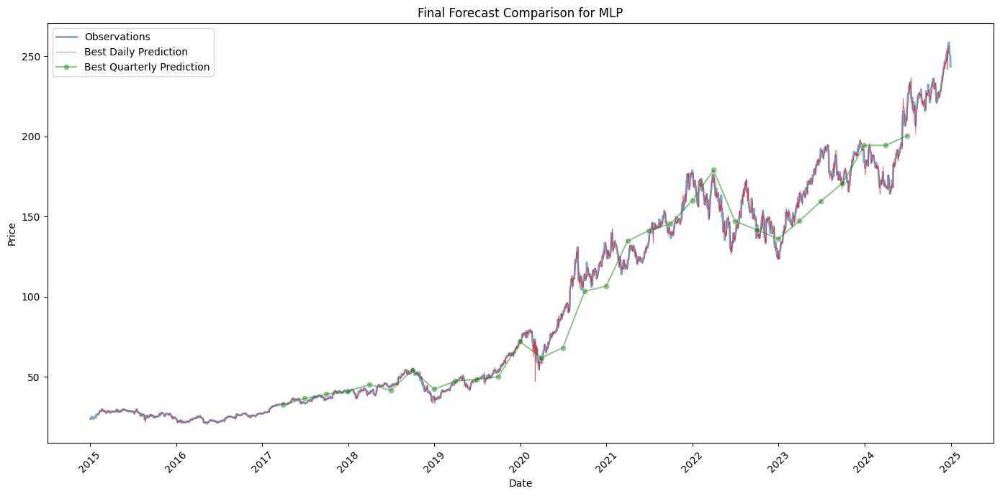

[INFO] Plotting RNN forecasts for AAPL...


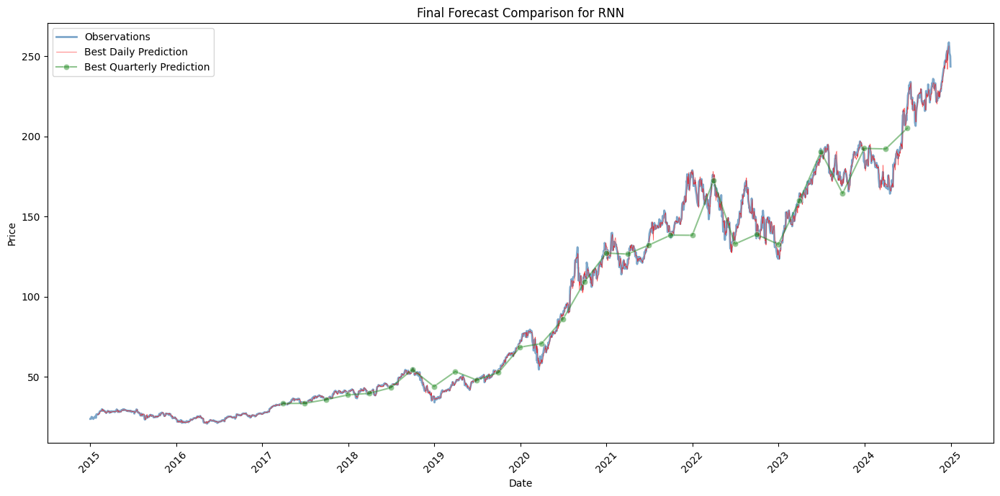

[INFO] Plotting LSTM forecasts for AAPL...


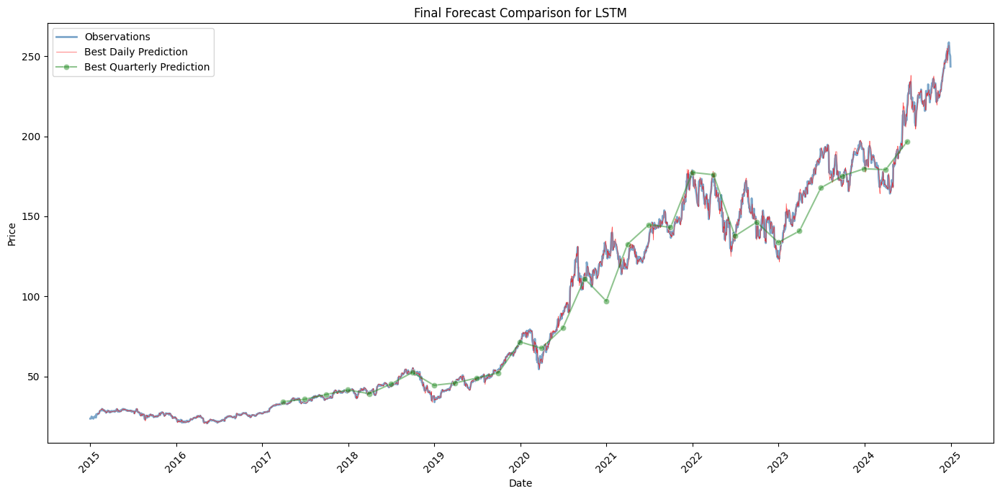

[INFO] Plotting GRU forecasts for AAPL...


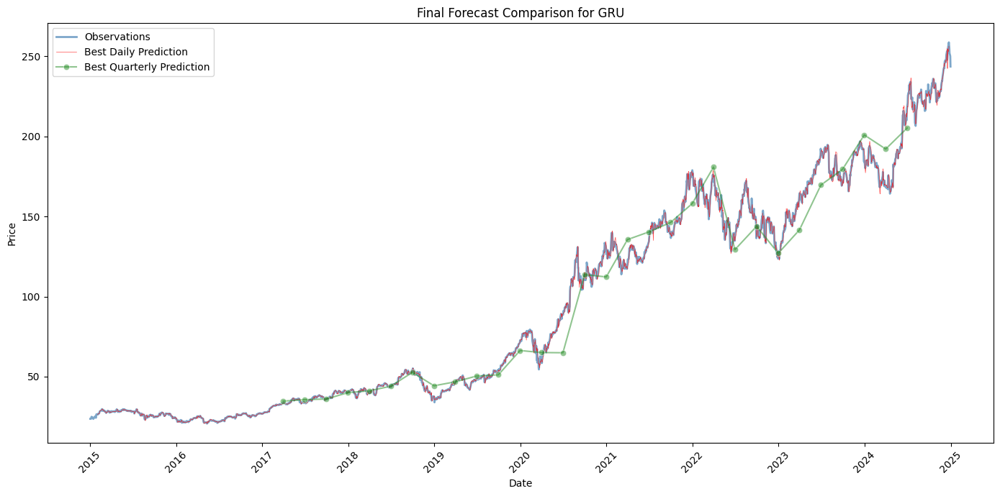

[INFO] Plotting MLP forecasts for MSFT...


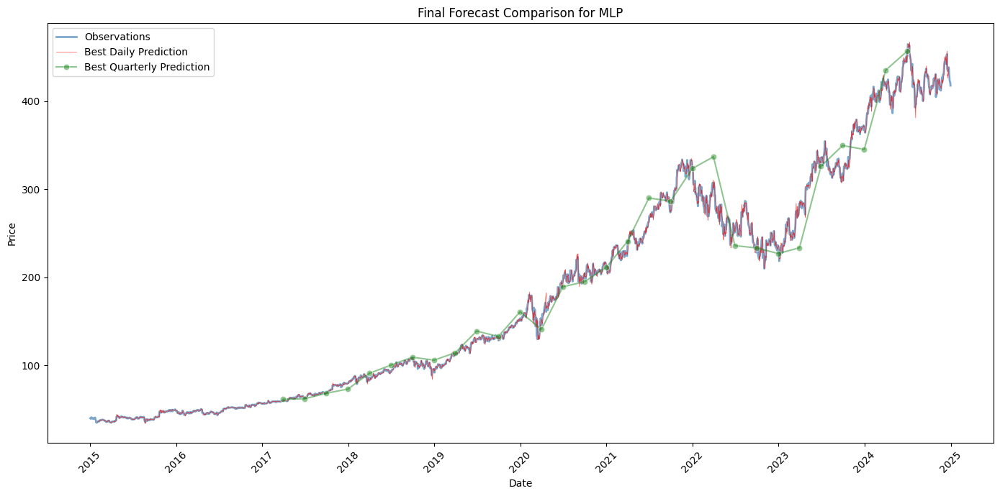

[INFO] Plotting RNN forecasts for MSFT...


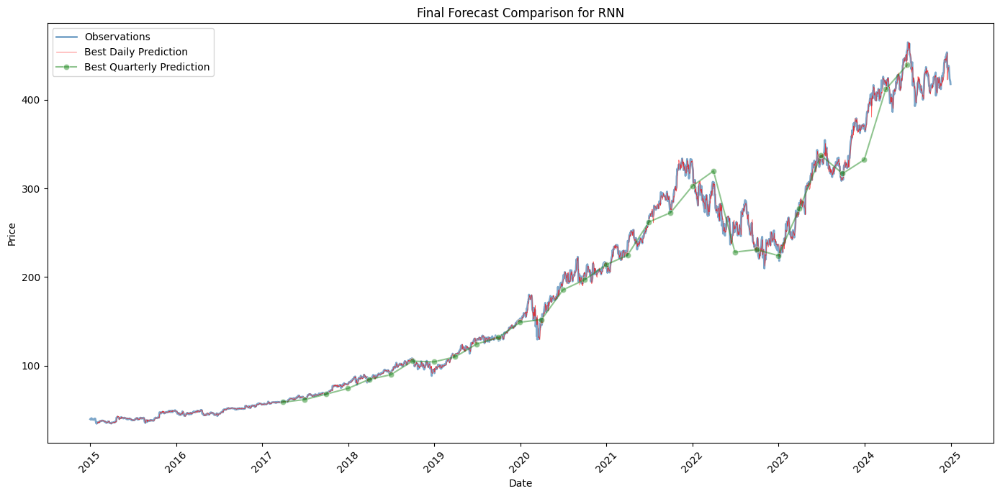

[INFO] Plotting LSTM forecasts for MSFT...


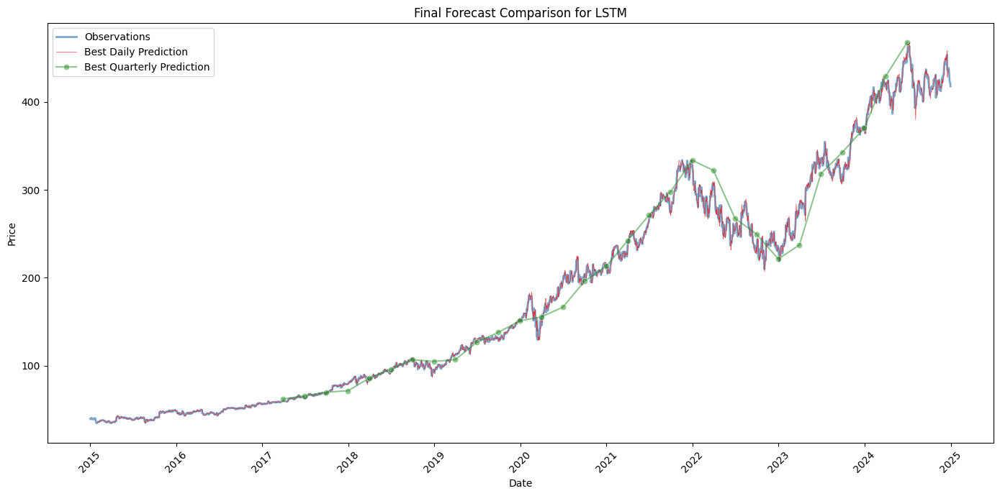

[INFO] Plotting GRU forecasts for MSFT...


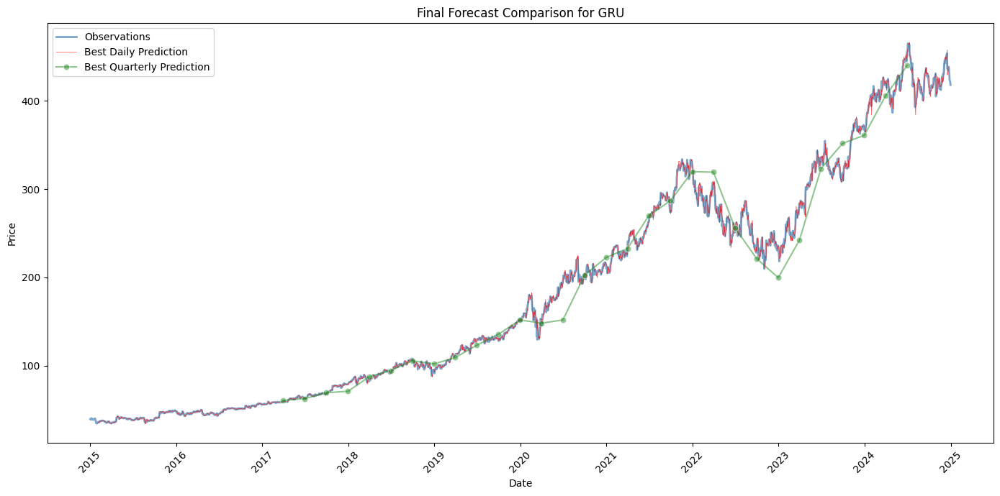

[INFO] Plotting MLP forecasts for LLY...


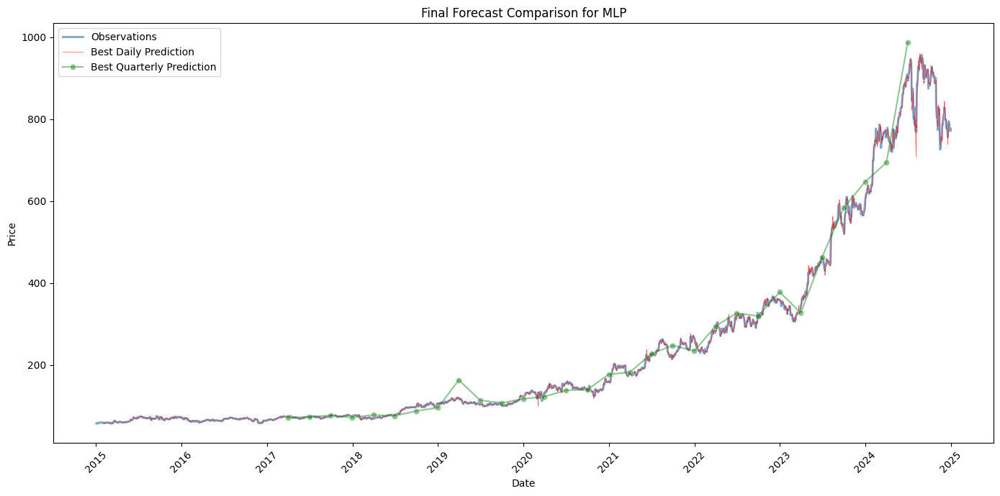

[INFO] Plotting RNN forecasts for LLY...


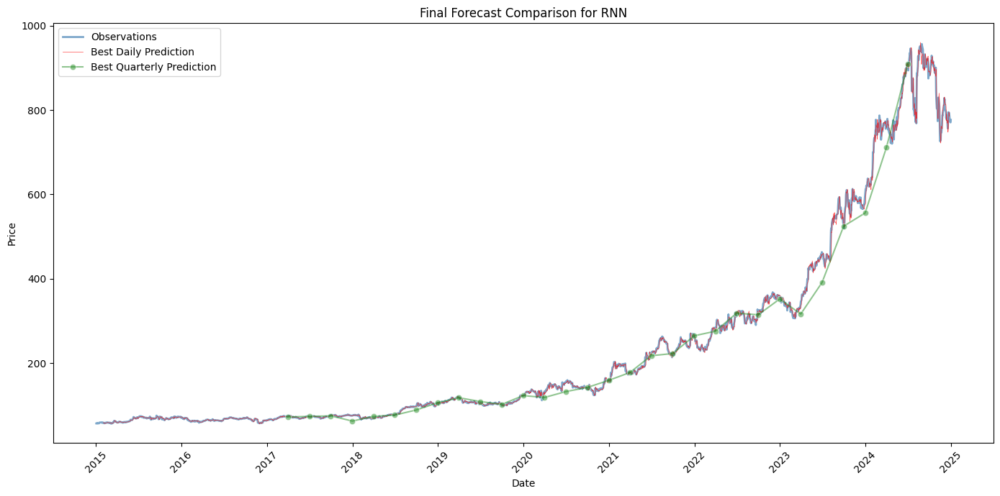

[INFO] Plotting LSTM forecasts for LLY...


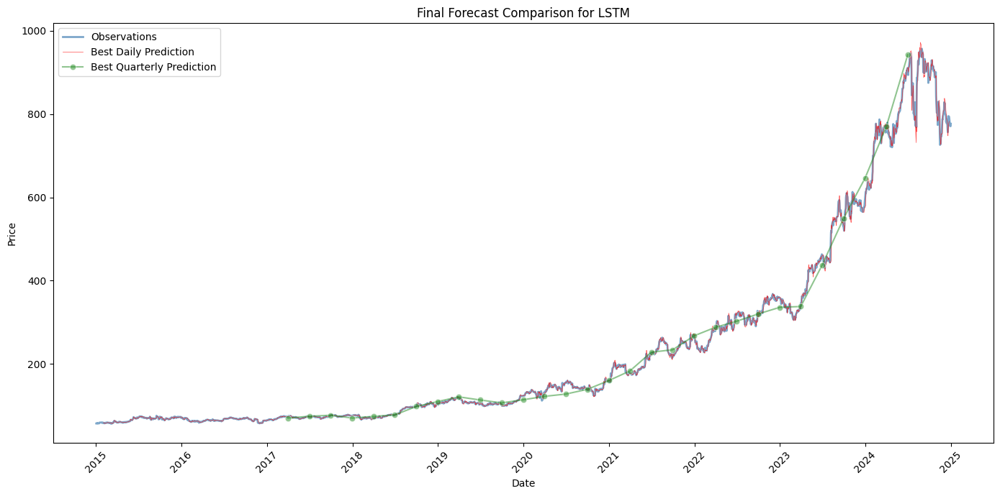

[INFO] Plotting GRU forecasts for LLY...


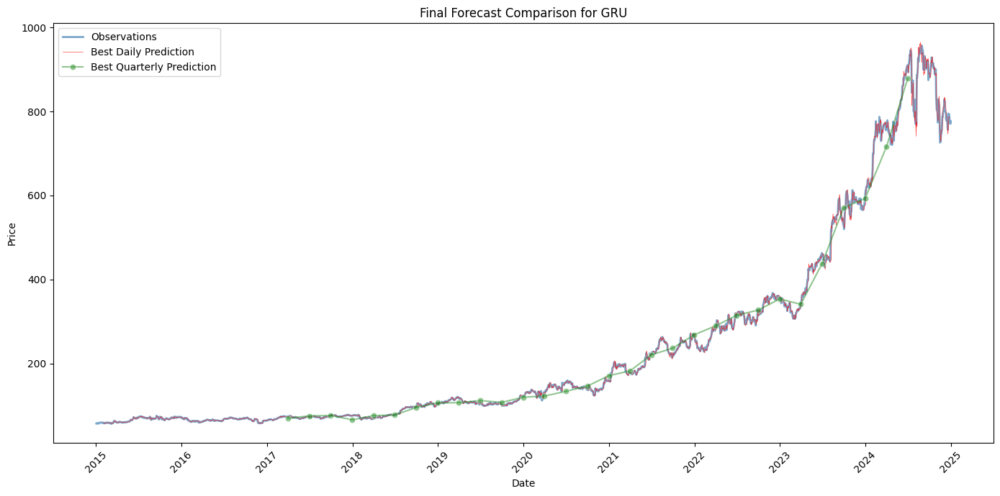

[INFO] Plotting MLP forecasts for UNH...


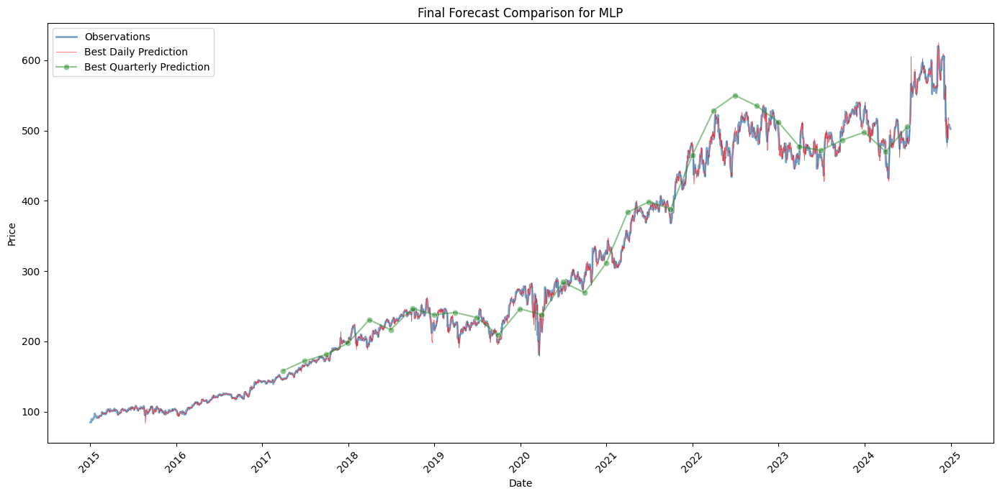

[INFO] Plotting RNN forecasts for UNH...


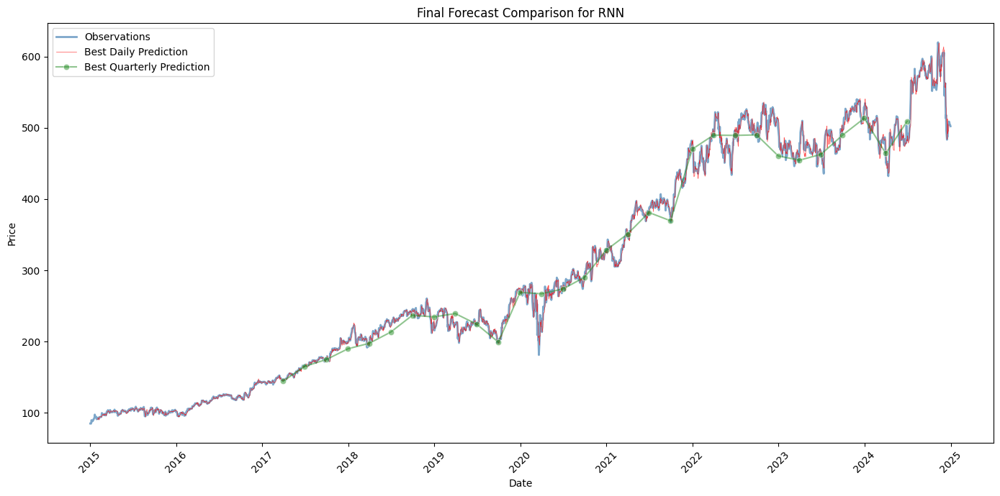

[INFO] Plotting LSTM forecasts for UNH...


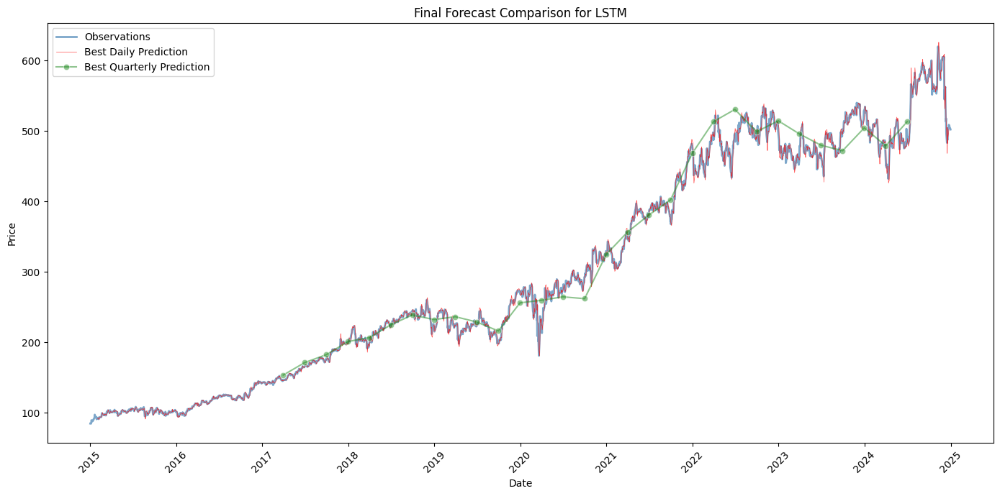

[INFO] Plotting GRU forecasts for UNH...


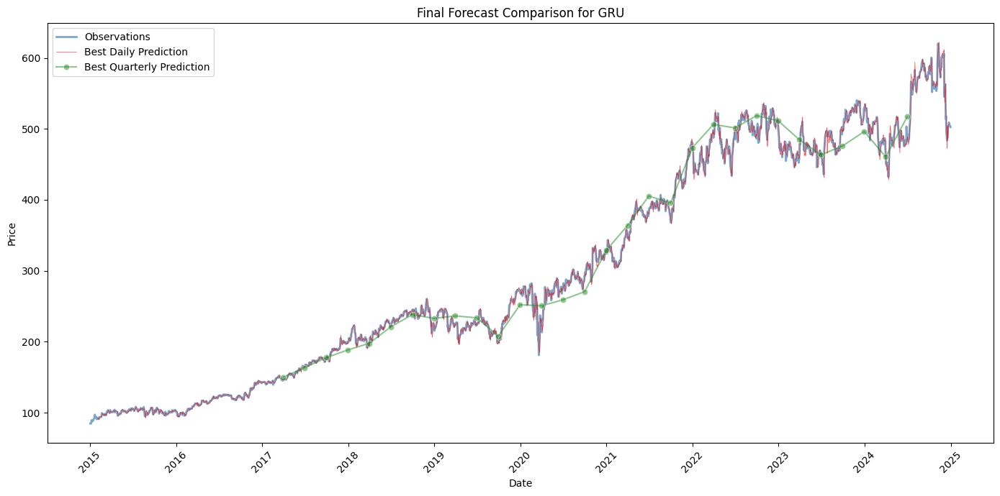

[INFO] Plotting MLP forecasts for V...


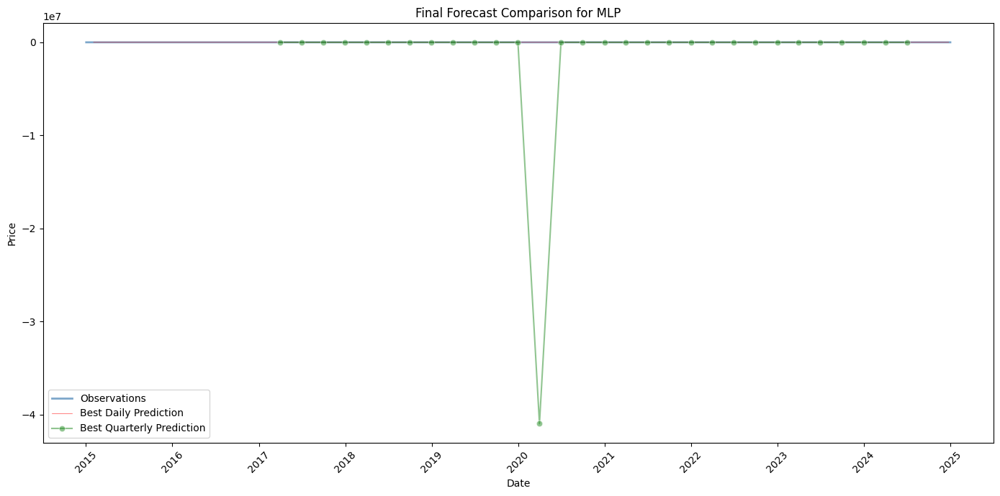

[INFO] Plotting RNN forecasts for V...


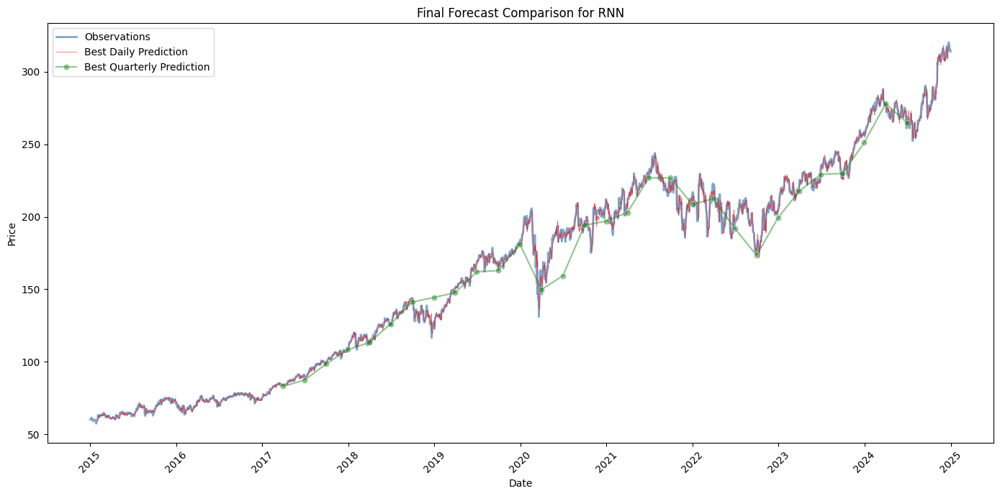

[INFO] Plotting LSTM forecasts for V...


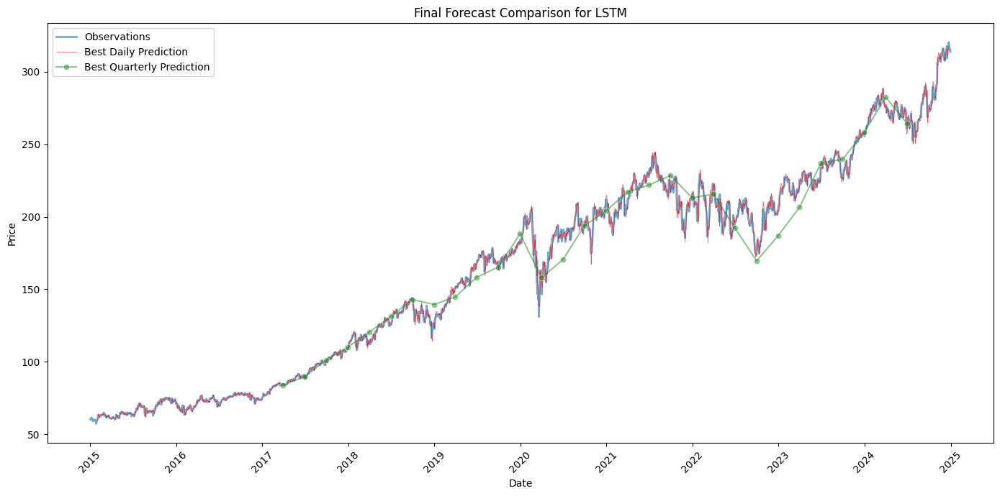

[INFO] Plotting GRU forecasts for V...


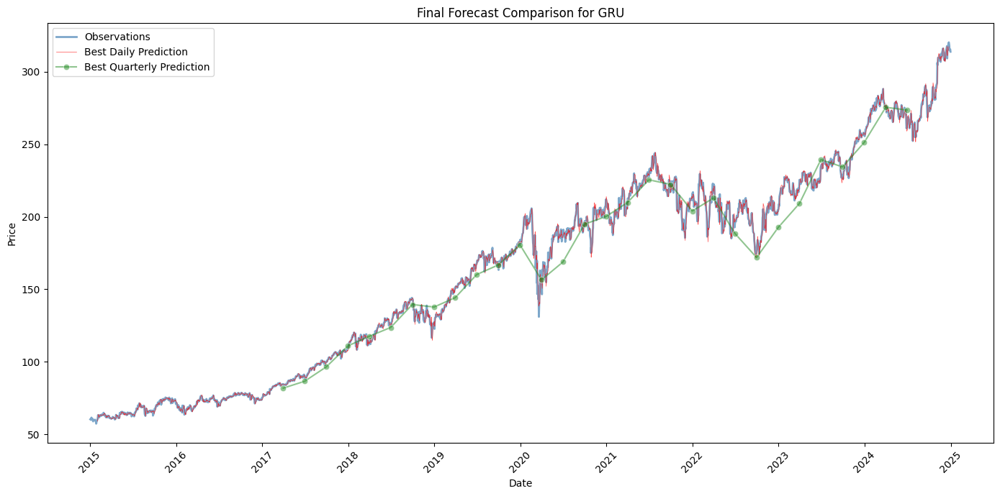

[INFO] Plotting MLP forecasts for MA...


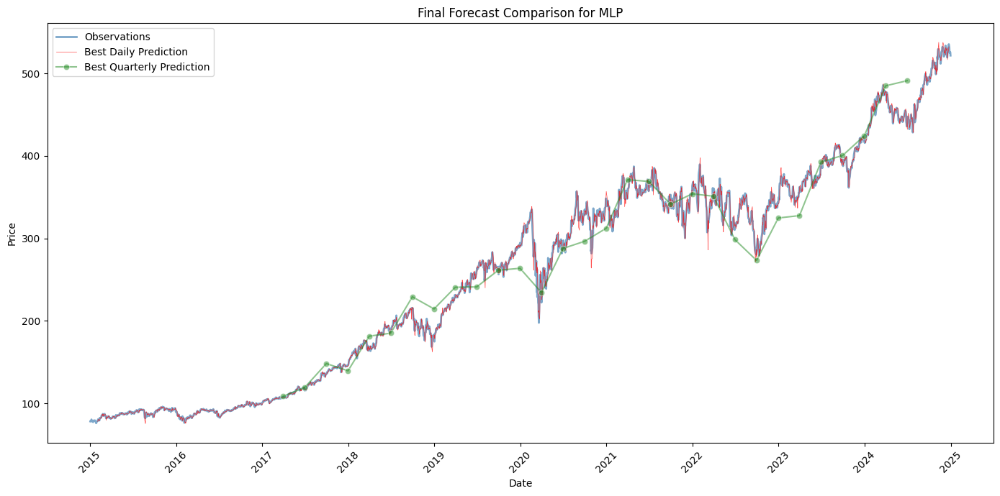

[INFO] Plotting RNN forecasts for MA...


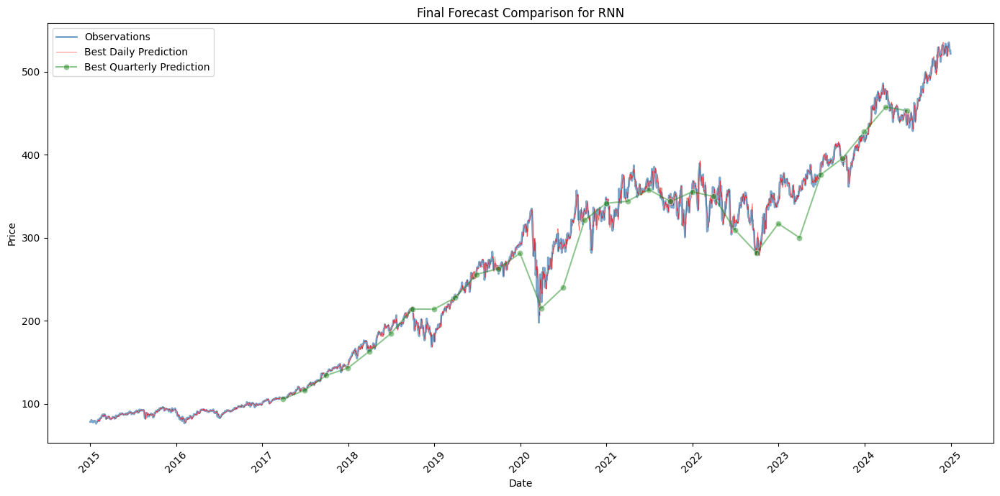

[INFO] Plotting LSTM forecasts for MA...


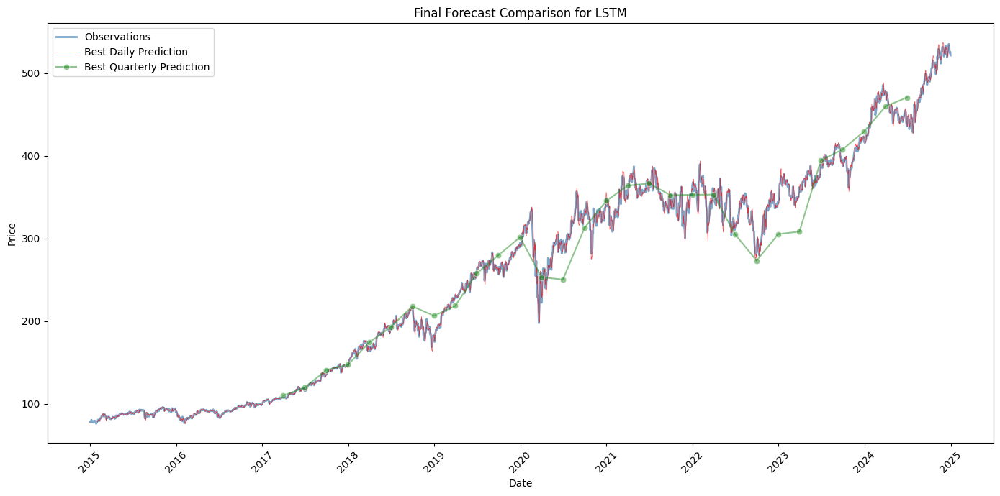

[INFO] Plotting GRU forecasts for MA...


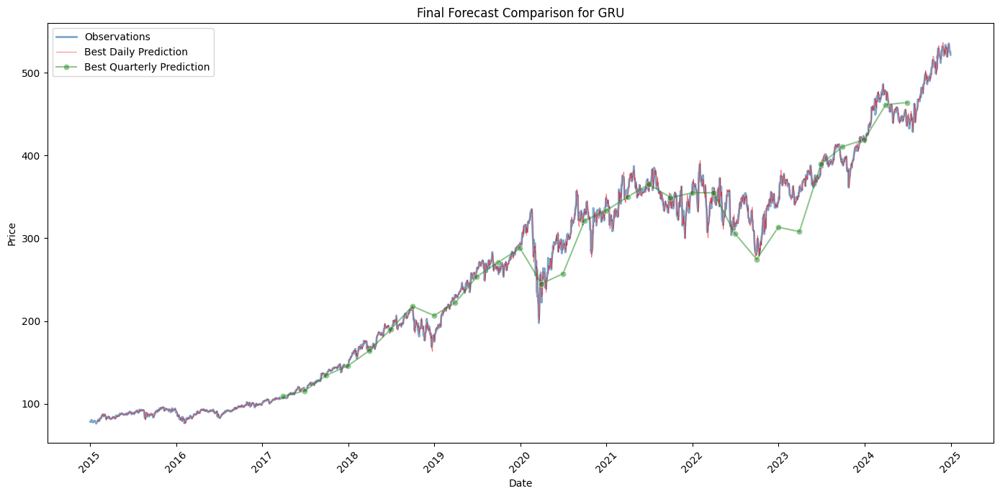

[INFO] Plotting MLP forecasts for GOOGL...


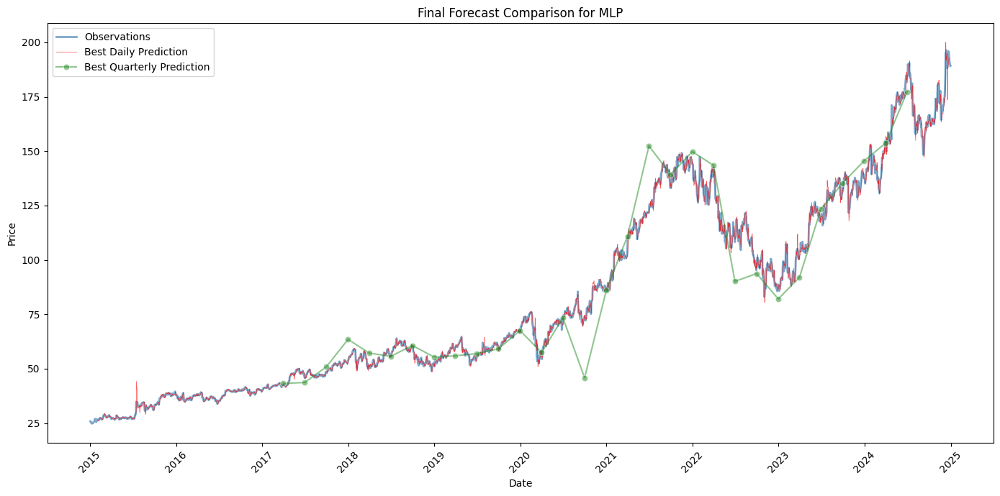

[INFO] Plotting RNN forecasts for GOOGL...


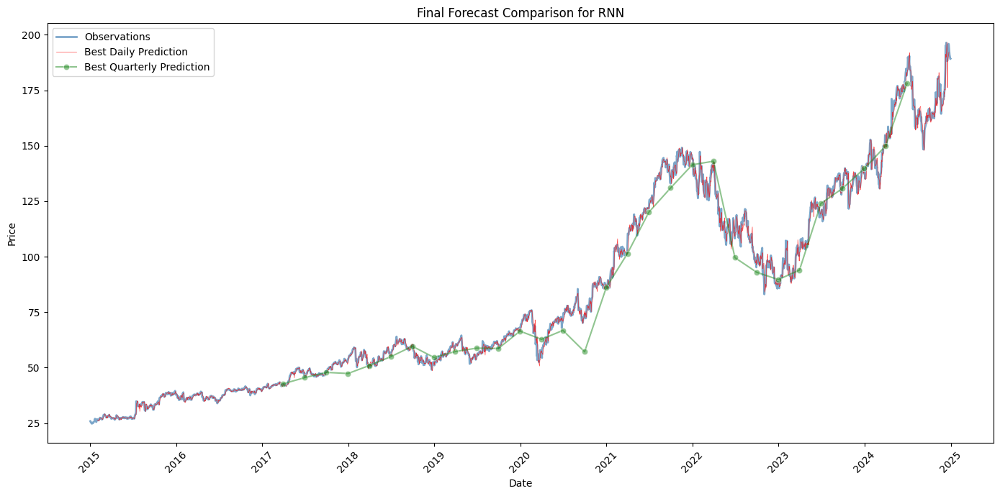

[INFO] Plotting LSTM forecasts for GOOGL...


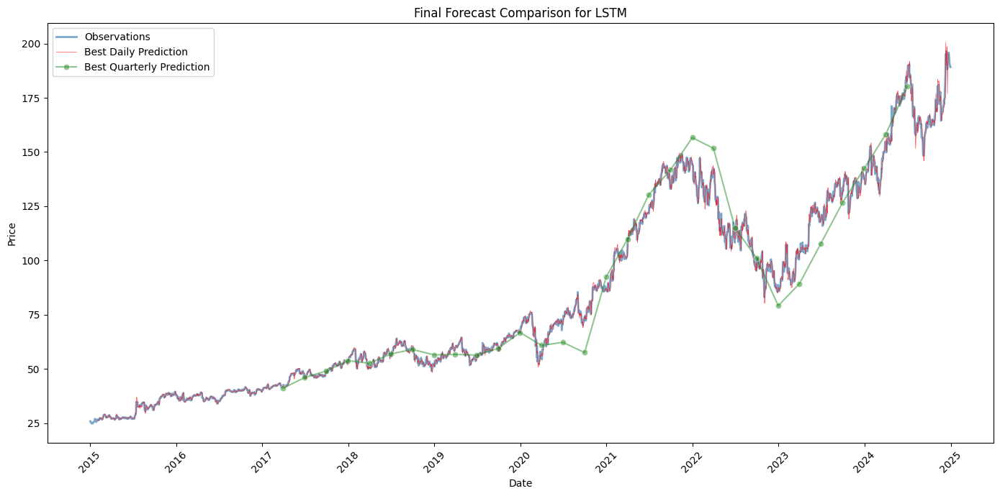

[INFO] Plotting GRU forecasts for GOOGL...


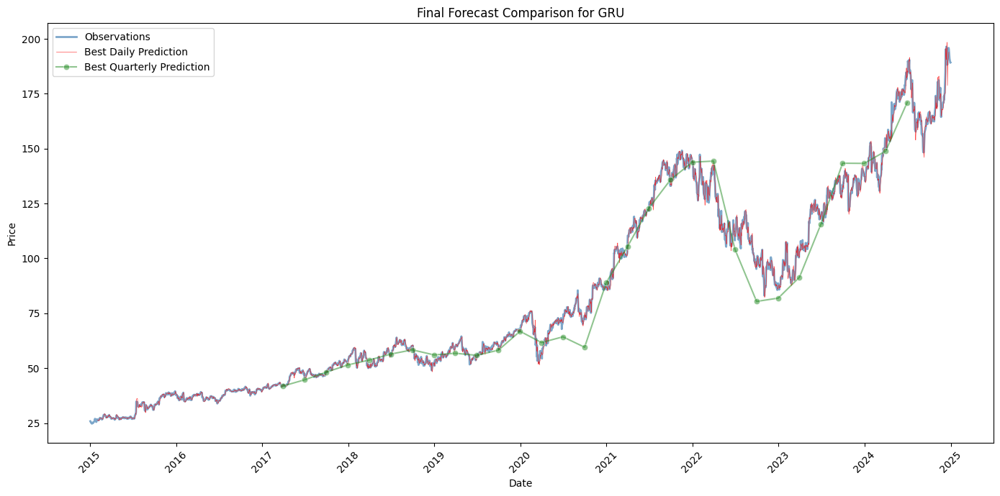

[INFO] Plotting MLP forecasts for META...


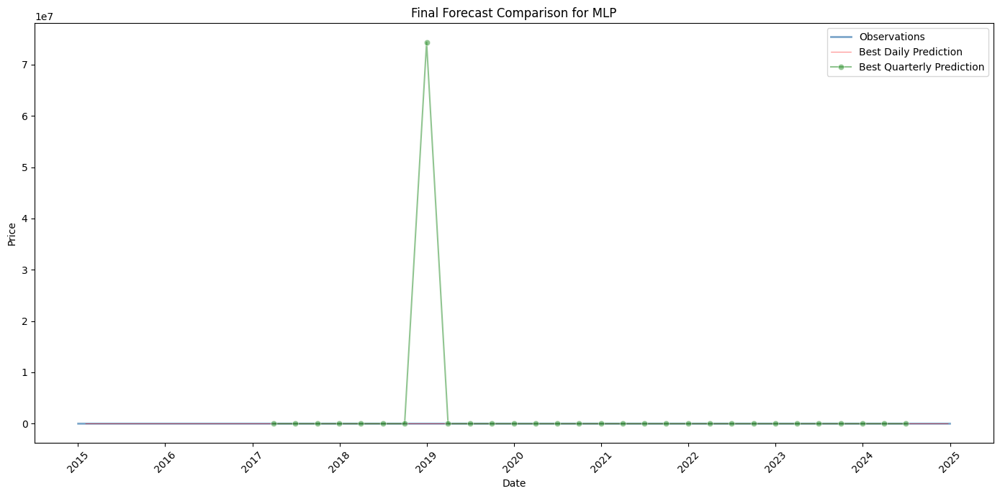

[INFO] Plotting RNN forecasts for META...


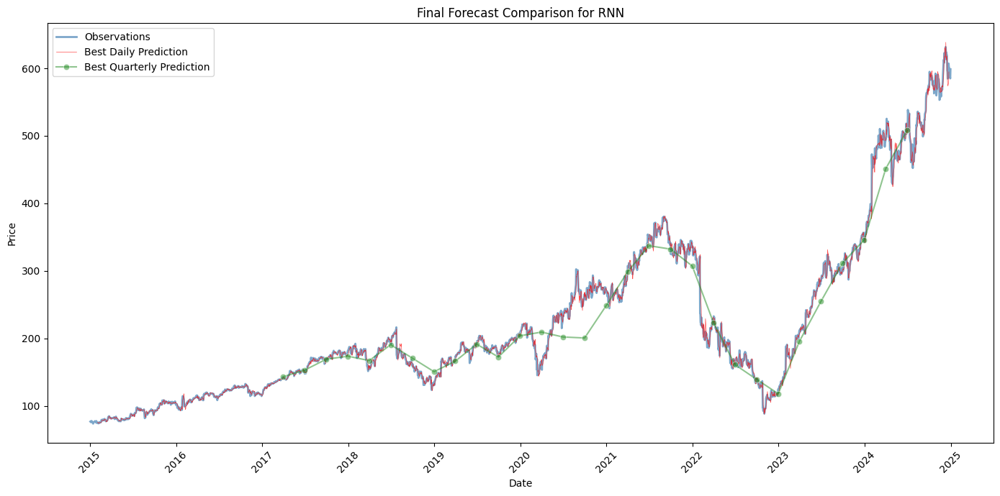

[INFO] Plotting LSTM forecasts for META...


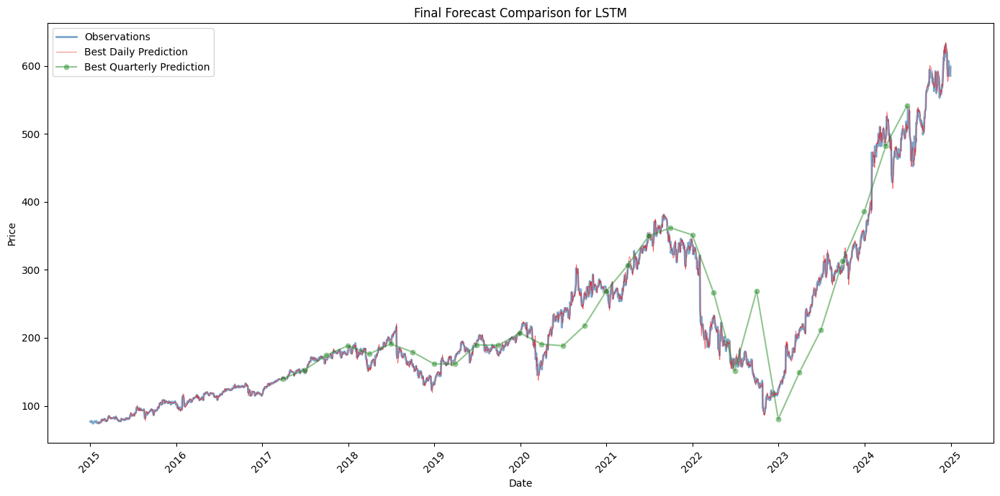

[INFO] Plotting GRU forecasts for META...


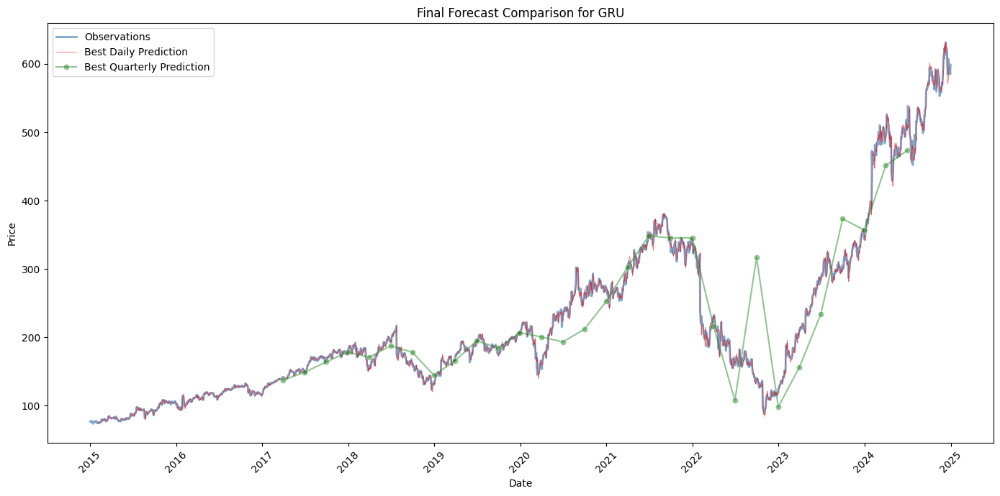

[INFO] Plotting MLP forecasts for AMZN...


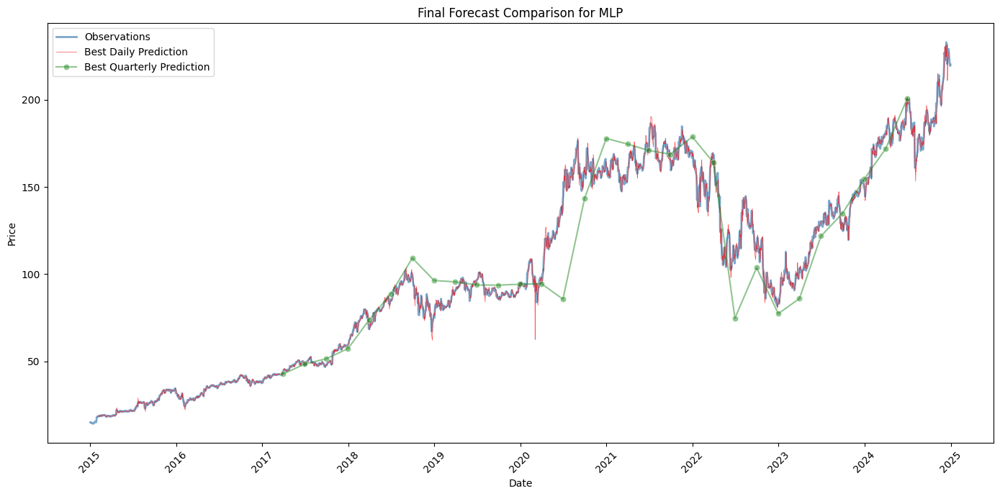

[INFO] Plotting RNN forecasts for AMZN...


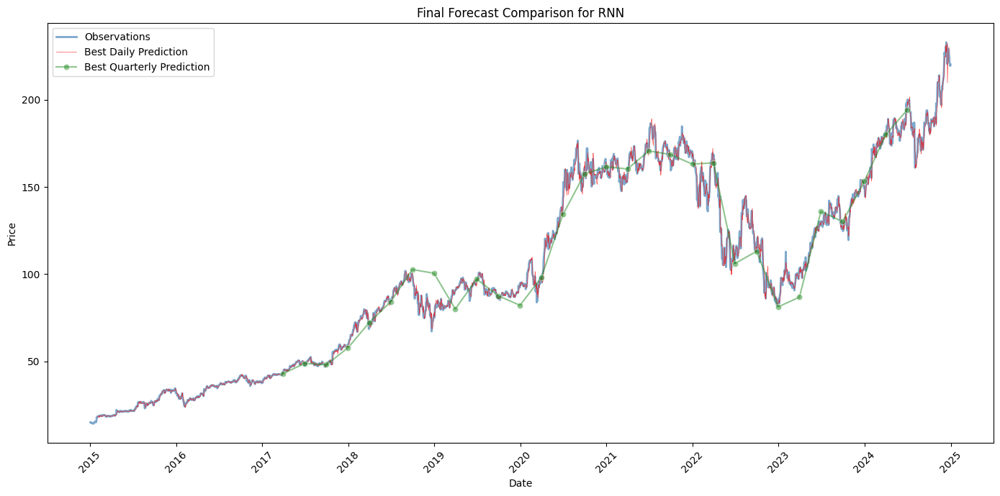

[INFO] Plotting LSTM forecasts for AMZN...


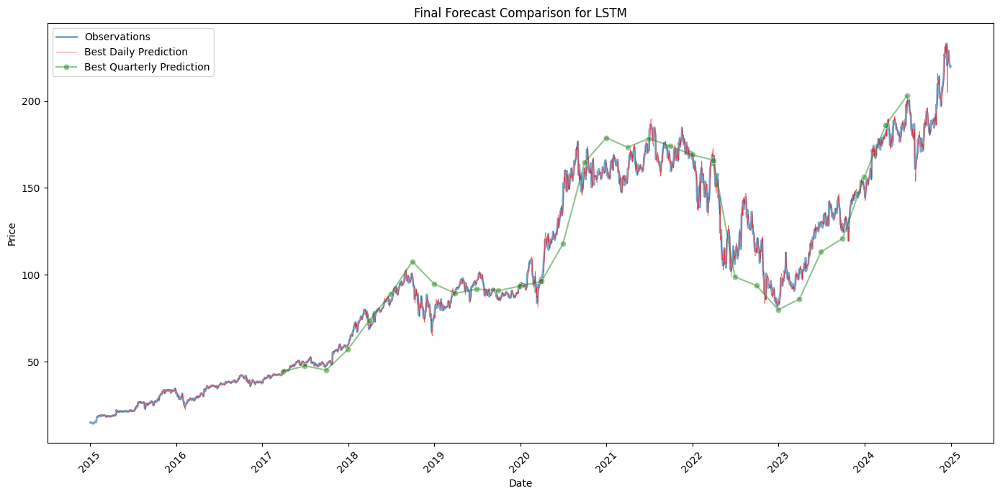

[INFO] Plotting GRU forecasts for AMZN...


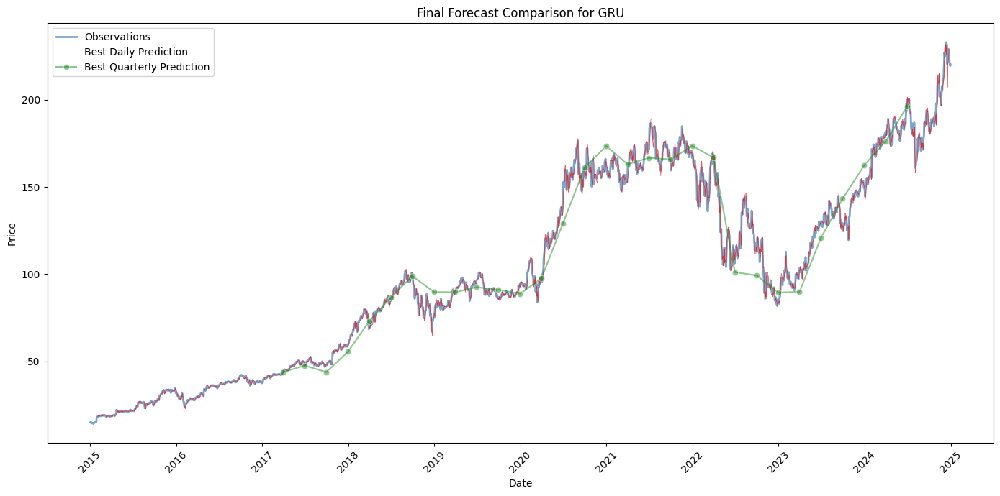

[INFO] Plotting MLP forecasts for TSLA...


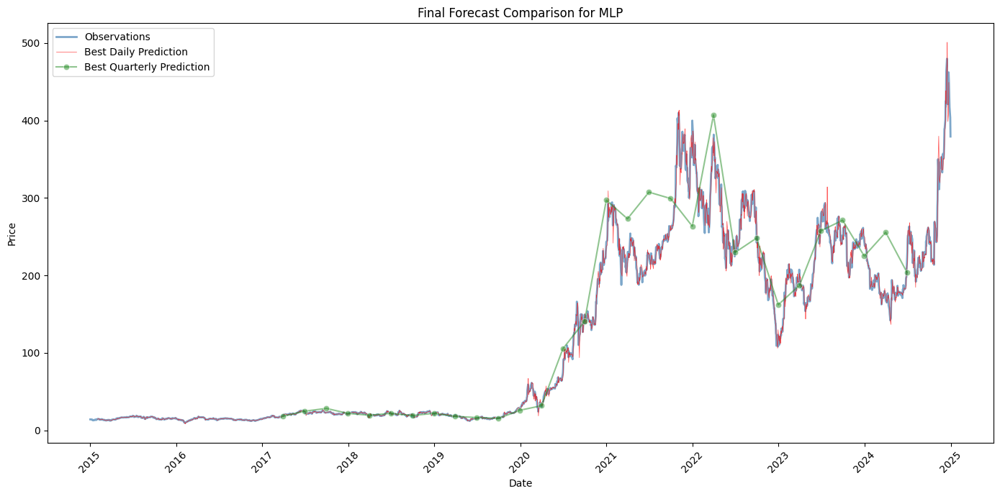

[INFO] Plotting RNN forecasts for TSLA...


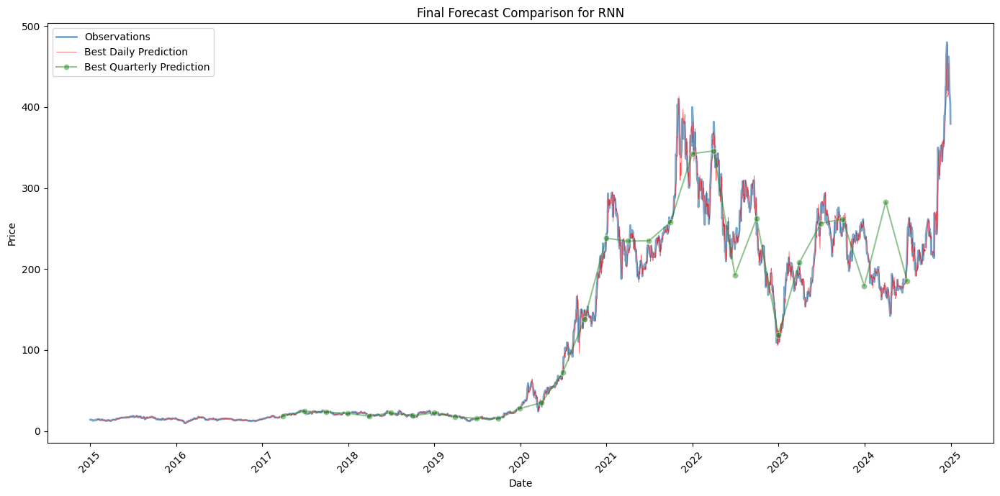

[INFO] Plotting LSTM forecasts for TSLA...


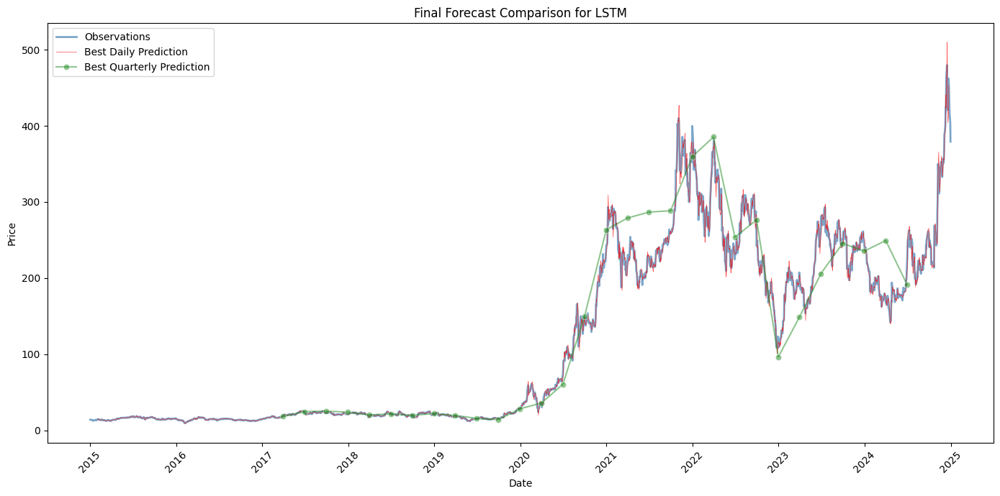

[INFO] Plotting GRU forecasts for TSLA...


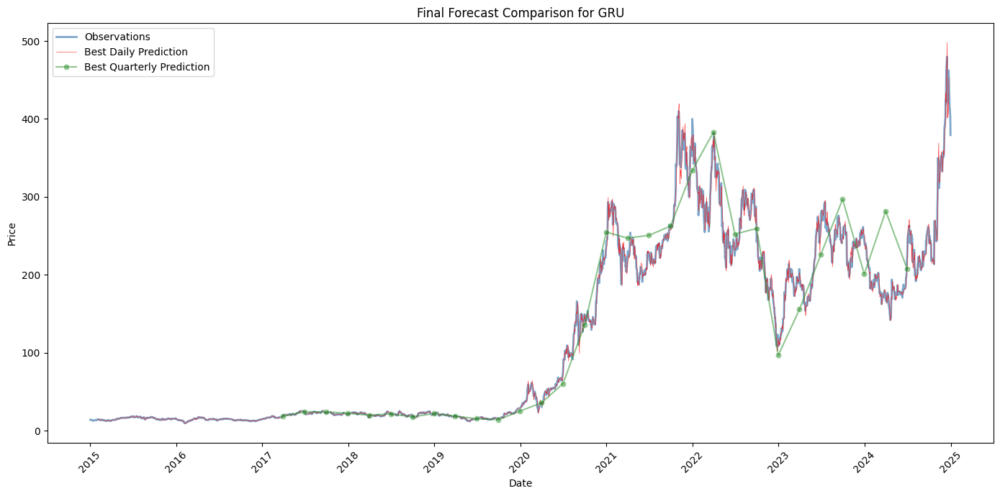

[INFO] Plotting MLP forecasts for PG...


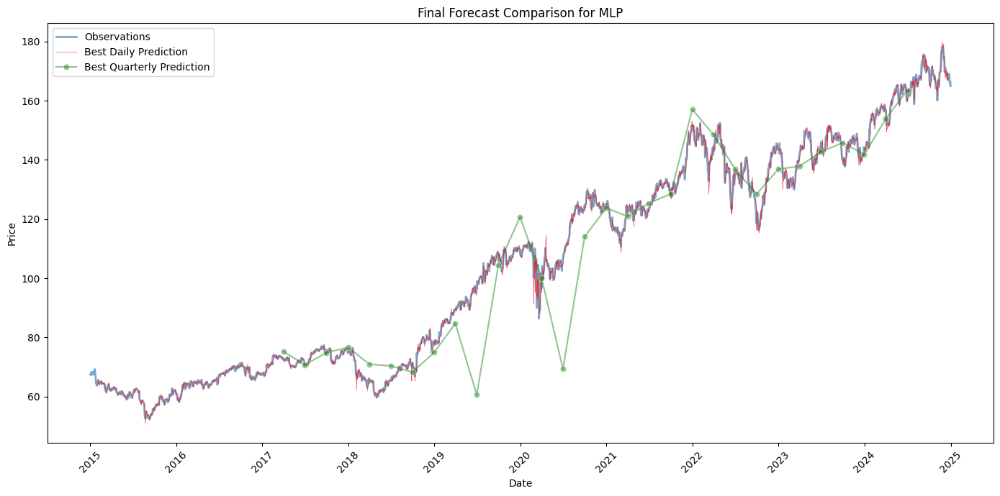

[INFO] Plotting RNN forecasts for PG...


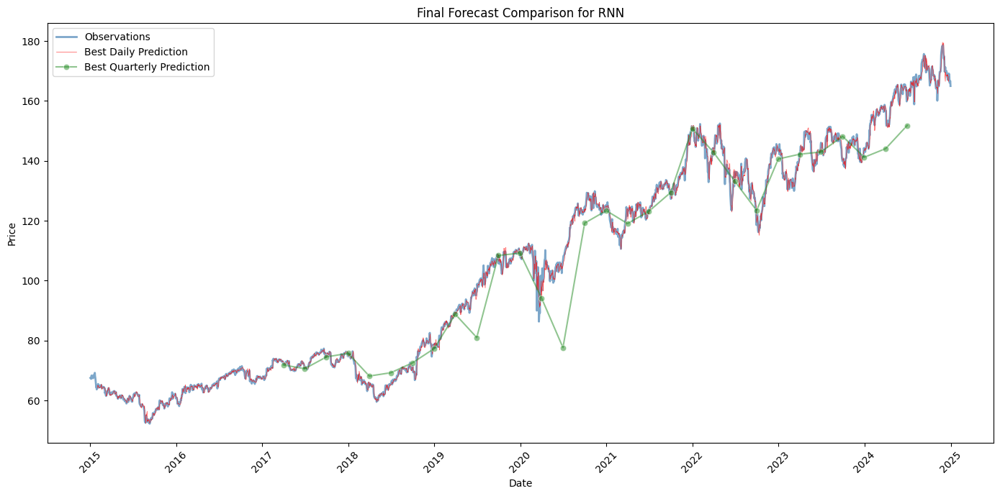

[INFO] Plotting LSTM forecasts for PG...


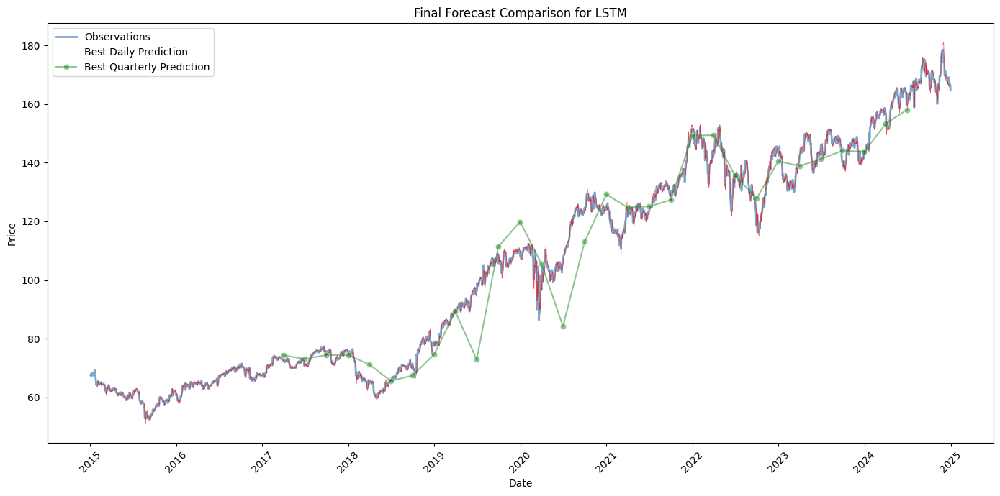

[INFO] Plotting GRU forecasts for PG...


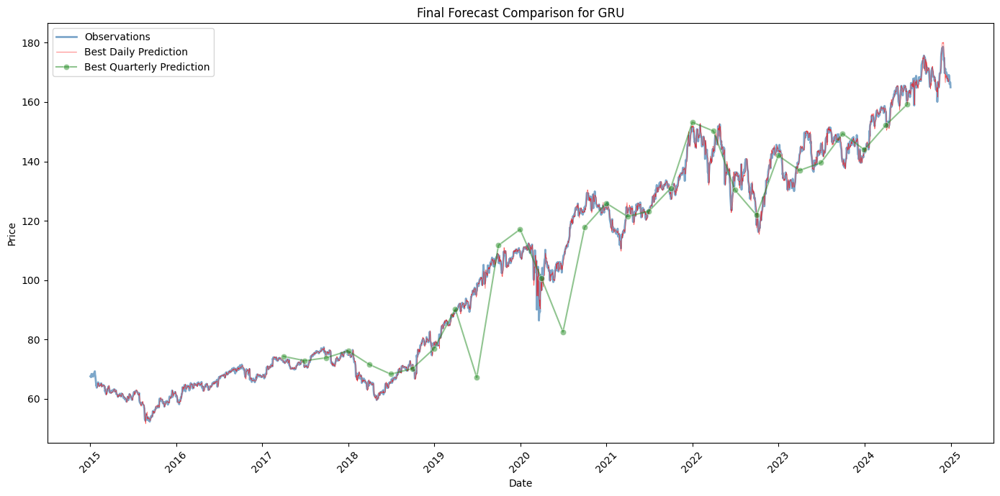

[INFO] Plotting MLP forecasts for WMT...


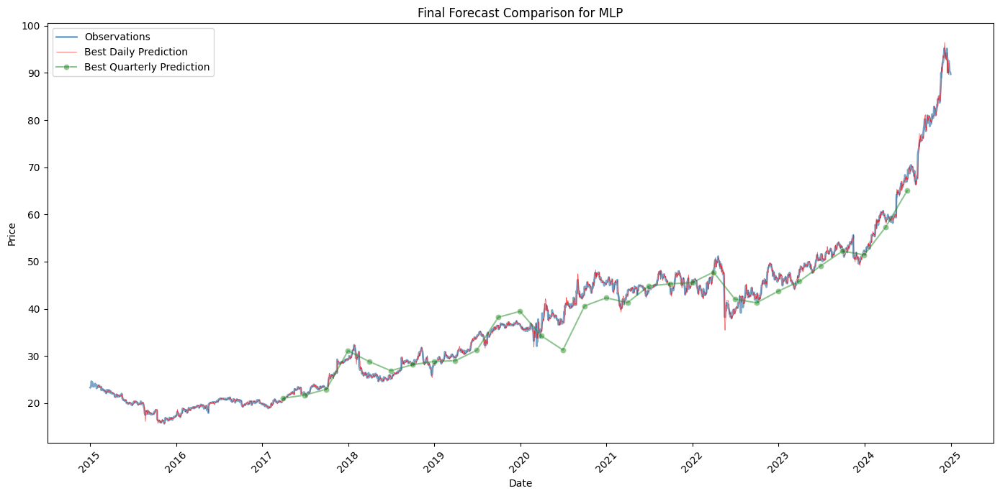

[INFO] Plotting RNN forecasts for WMT...


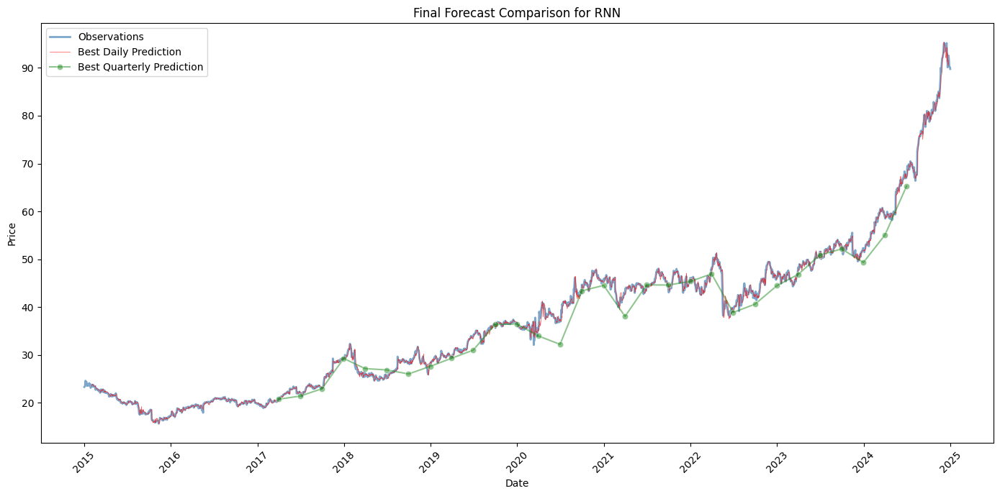

[INFO] Plotting LSTM forecasts for WMT...


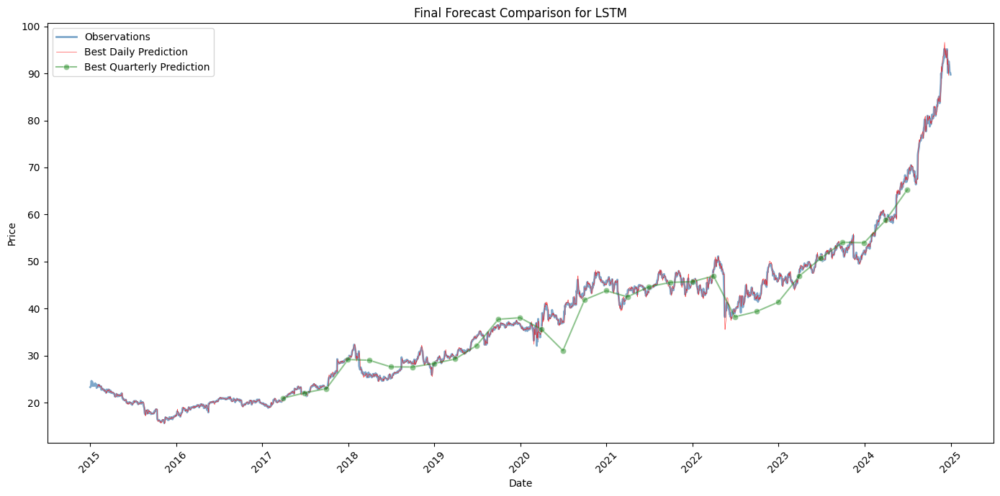

[INFO] Plotting GRU forecasts for WMT...


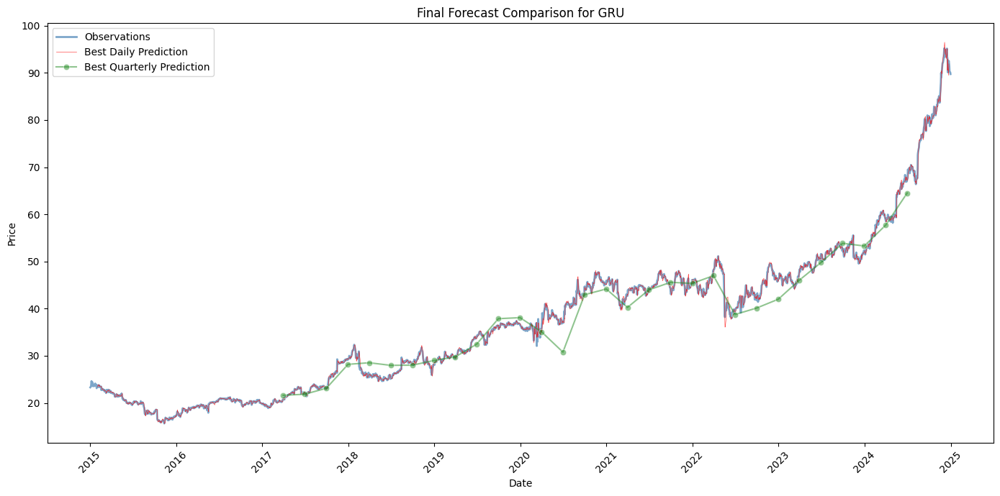

[INFO] Plotting MLP forecasts for RTX...


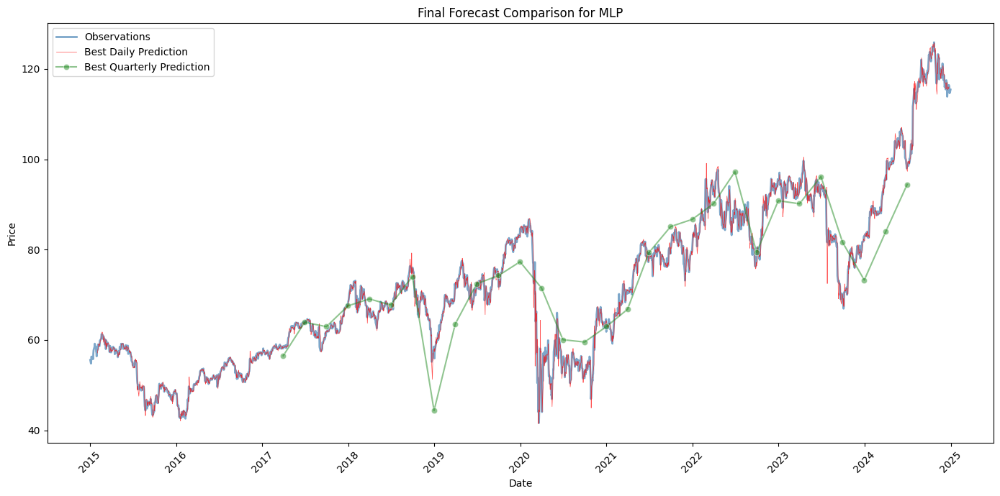

[INFO] Plotting RNN forecasts for RTX...


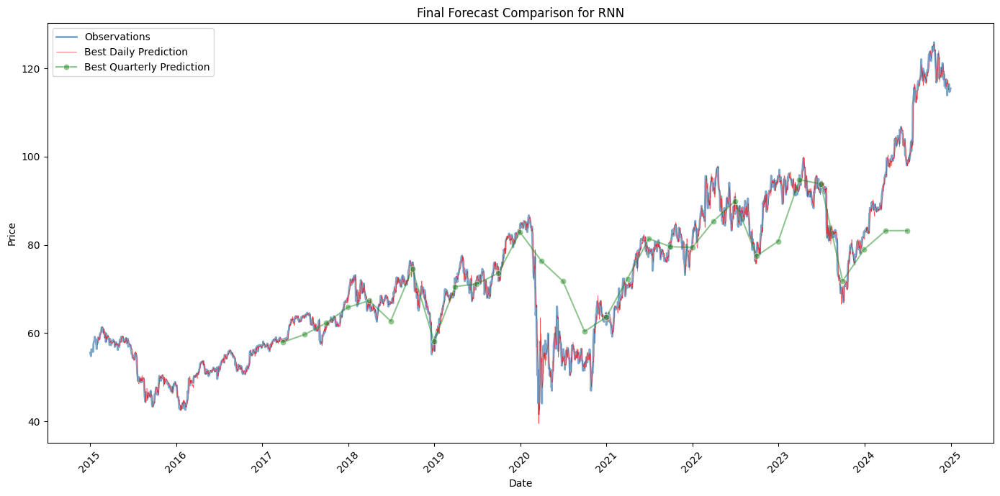

[INFO] Plotting LSTM forecasts for RTX...


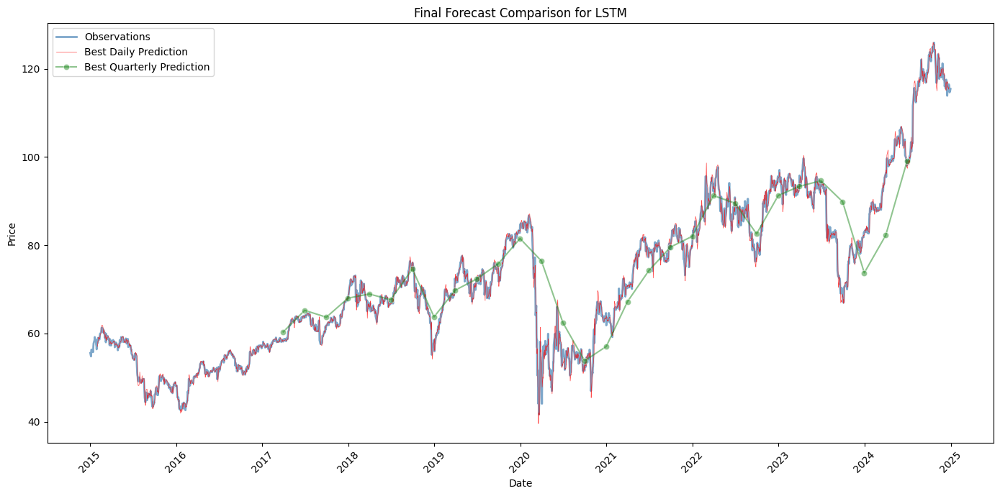

[INFO] Plotting GRU forecasts for RTX...


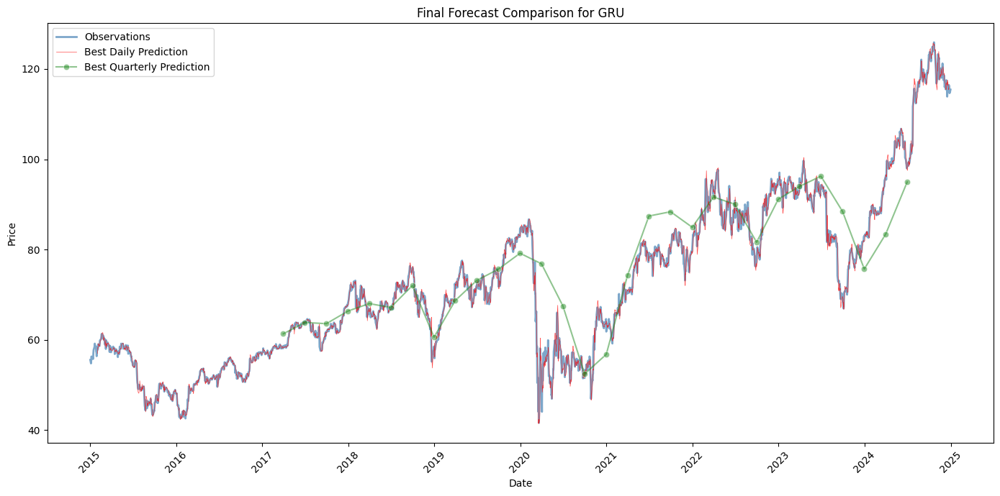

[INFO] Plotting MLP forecasts for UNP...


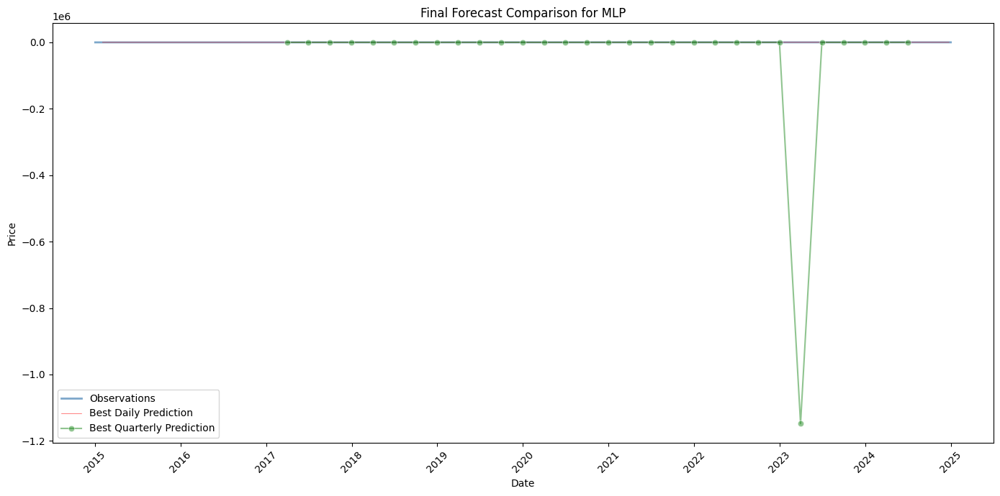

[INFO] Plotting RNN forecasts for UNP...


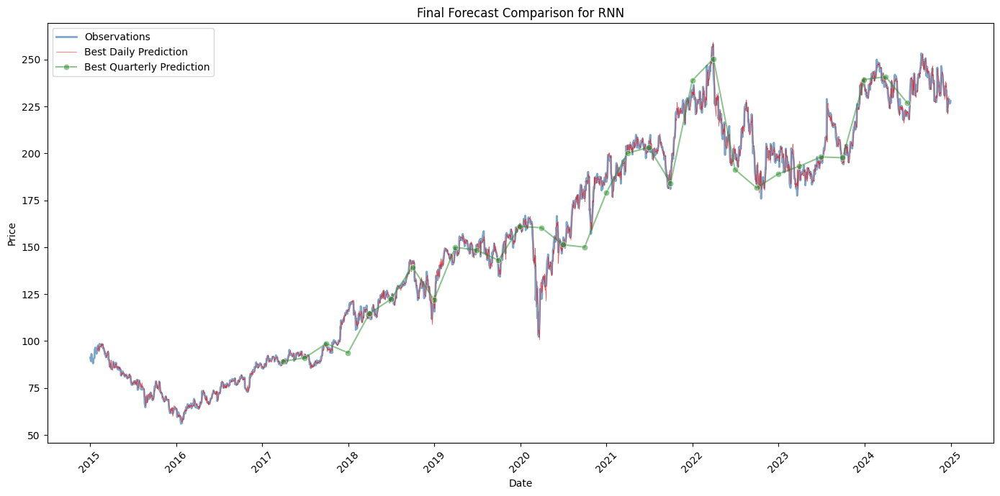

[INFO] Plotting LSTM forecasts for UNP...


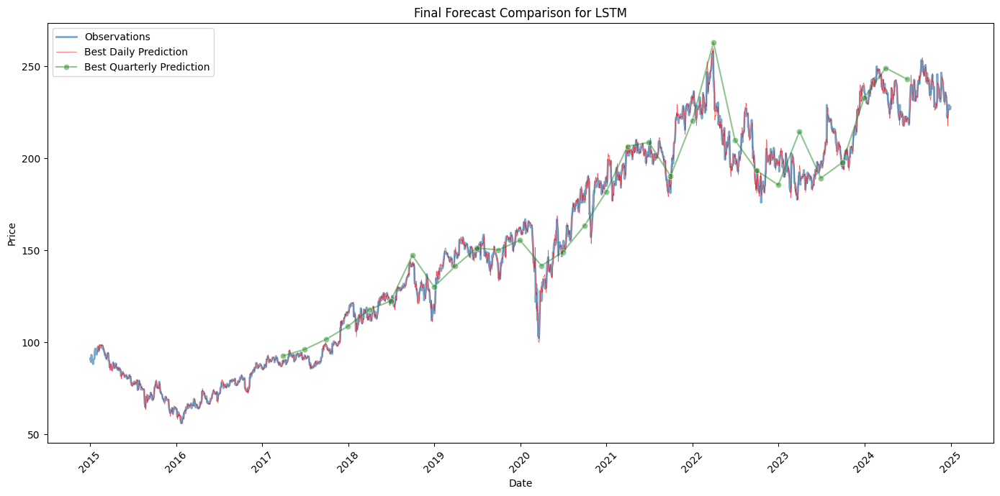

[INFO] Plotting GRU forecasts for UNP...


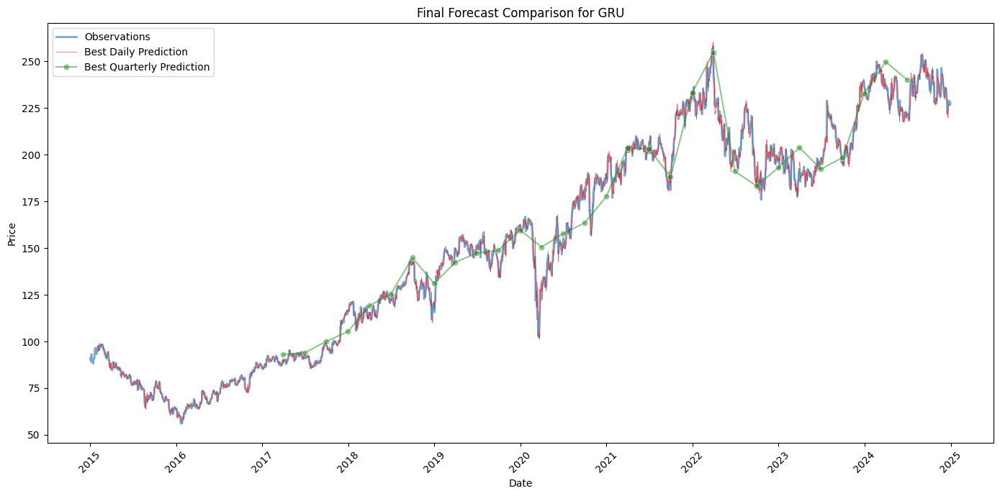

[INFO] Plotting MLP forecasts for XOM...


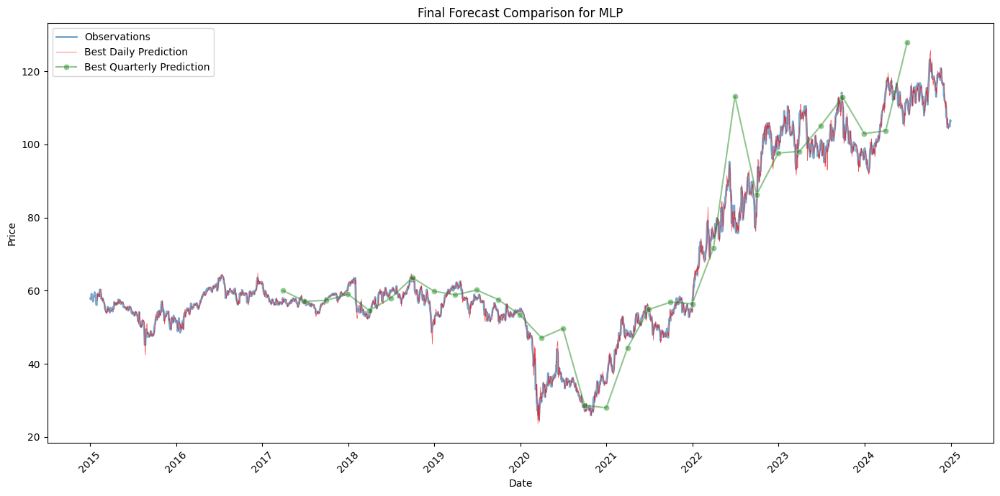

[INFO] Plotting RNN forecasts for XOM...


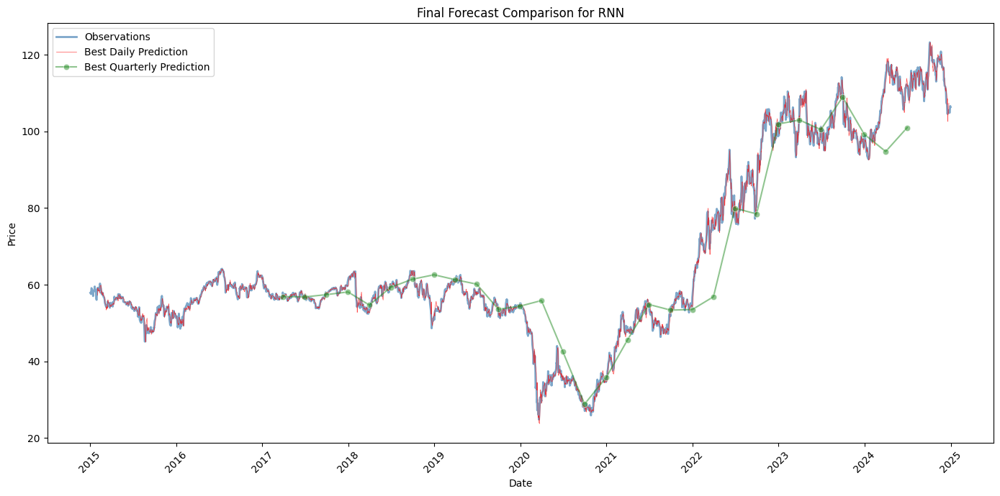

[INFO] Plotting LSTM forecasts for XOM...


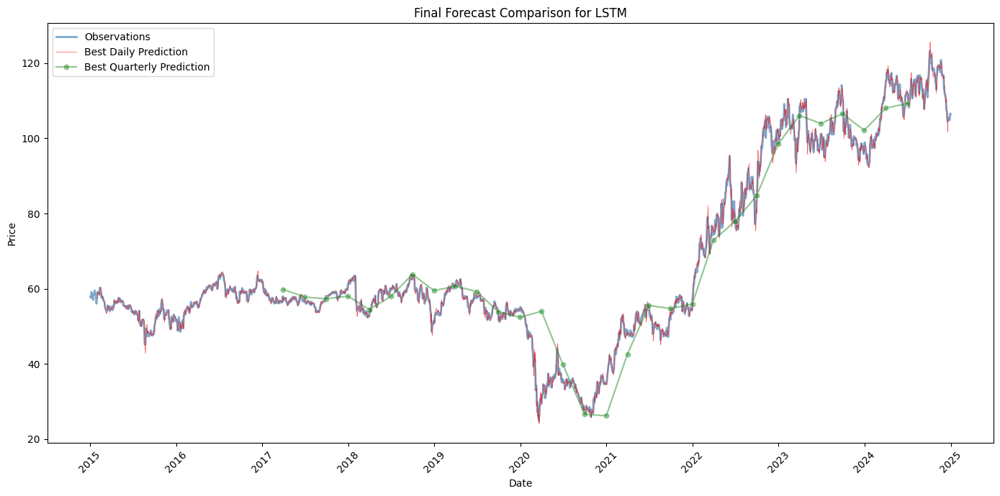

[INFO] Plotting GRU forecasts for XOM...


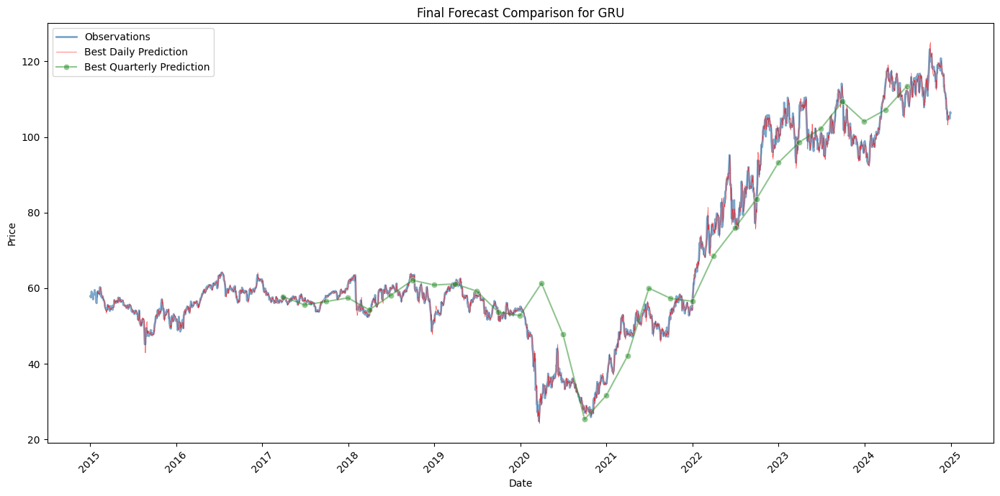

[INFO] Plotting MLP forecasts for CVX...


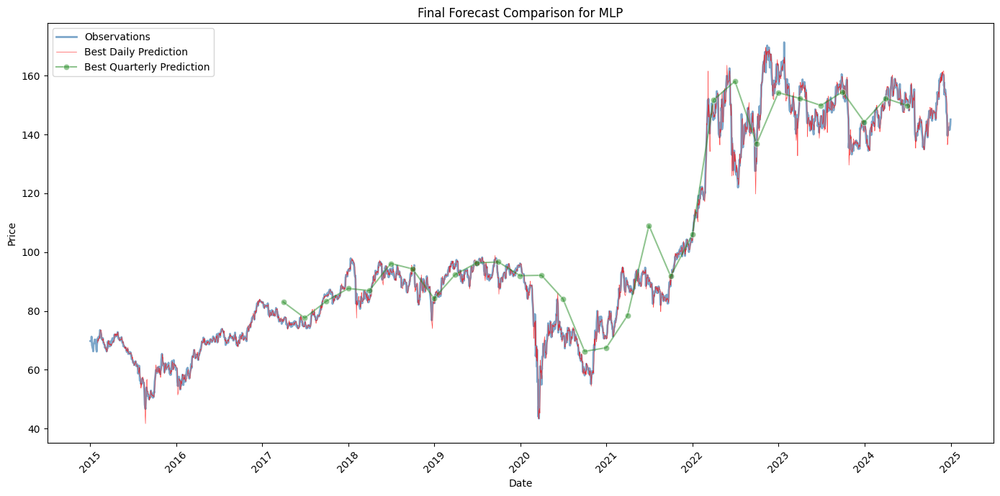

[INFO] Plotting RNN forecasts for CVX...


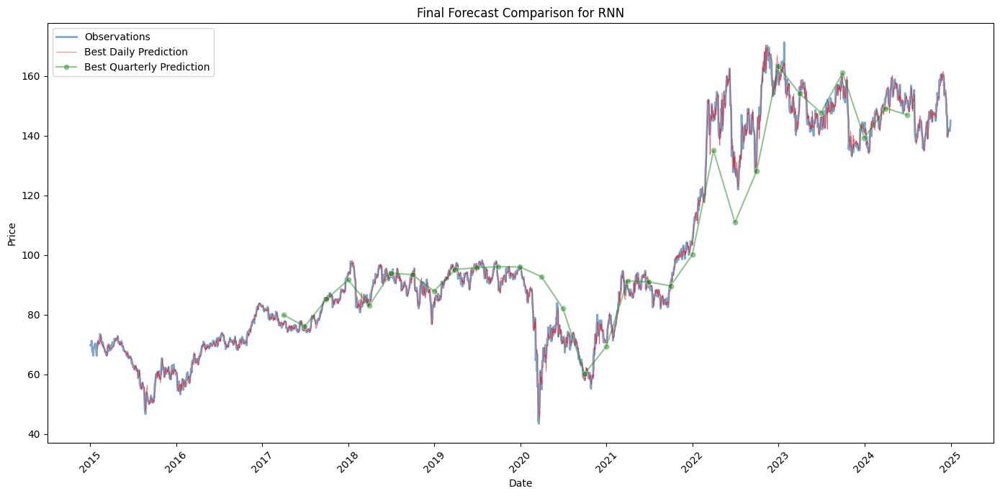

[INFO] Plotting LSTM forecasts for CVX...


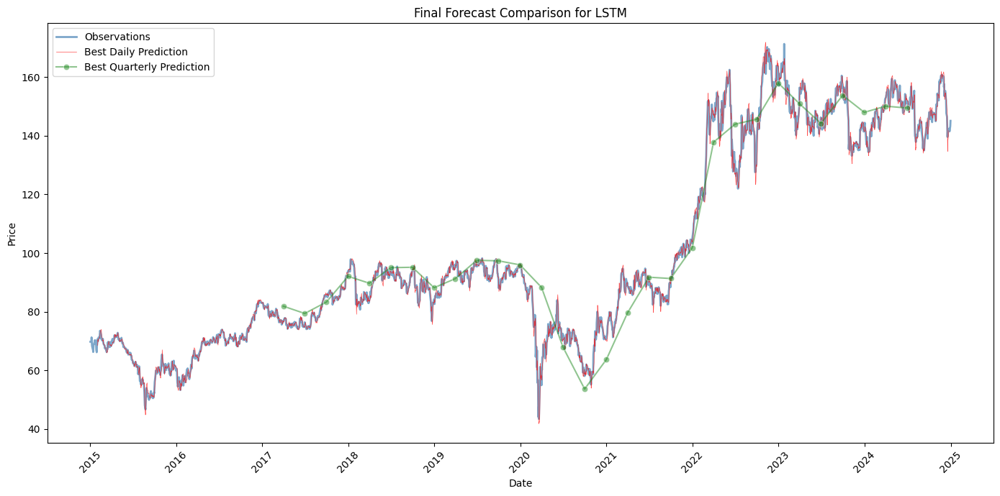

[INFO] Plotting GRU forecasts for CVX...


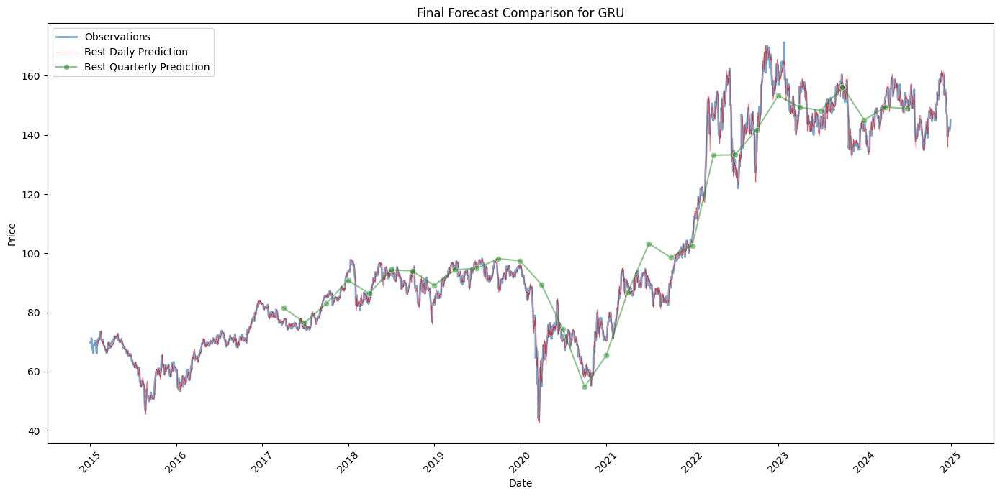

[INFO] Plotting MLP forecasts for LIN...


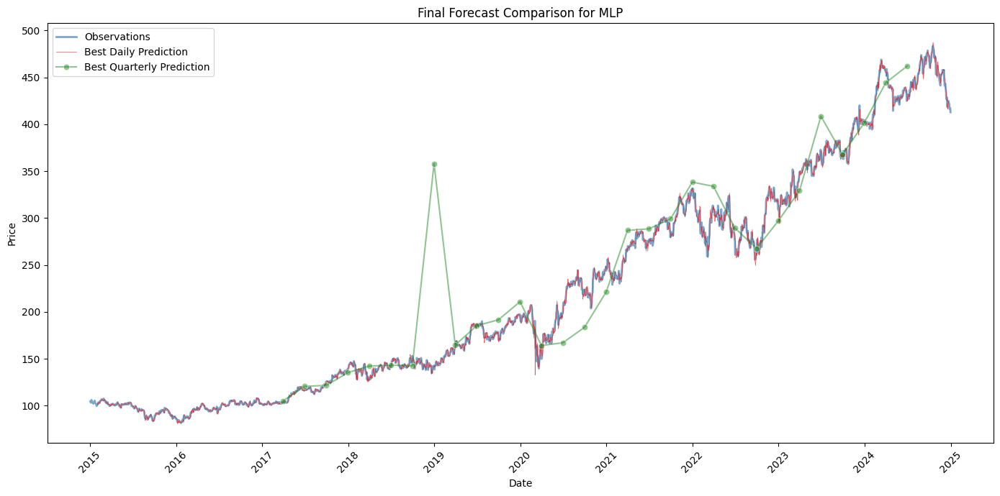

[INFO] Plotting RNN forecasts for LIN...


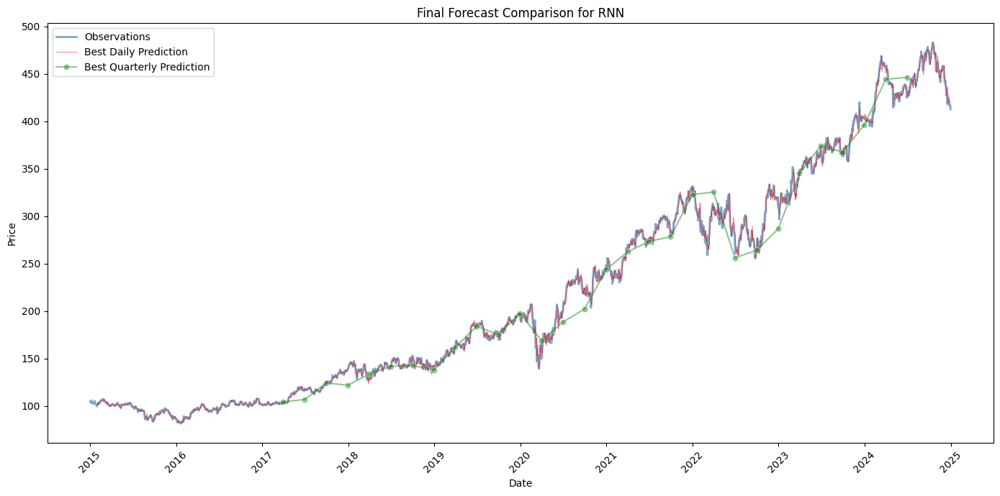

[INFO] Plotting LSTM forecasts for LIN...


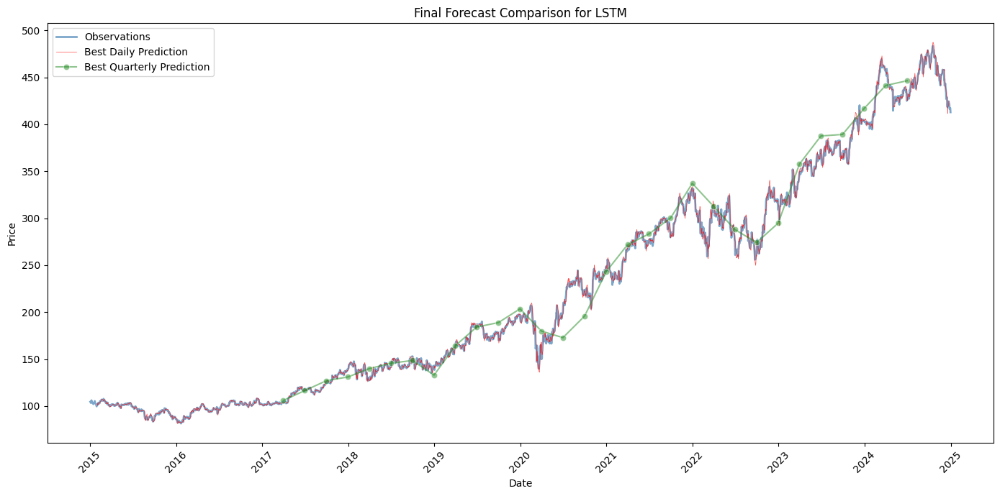

[INFO] Plotting GRU forecasts for LIN...


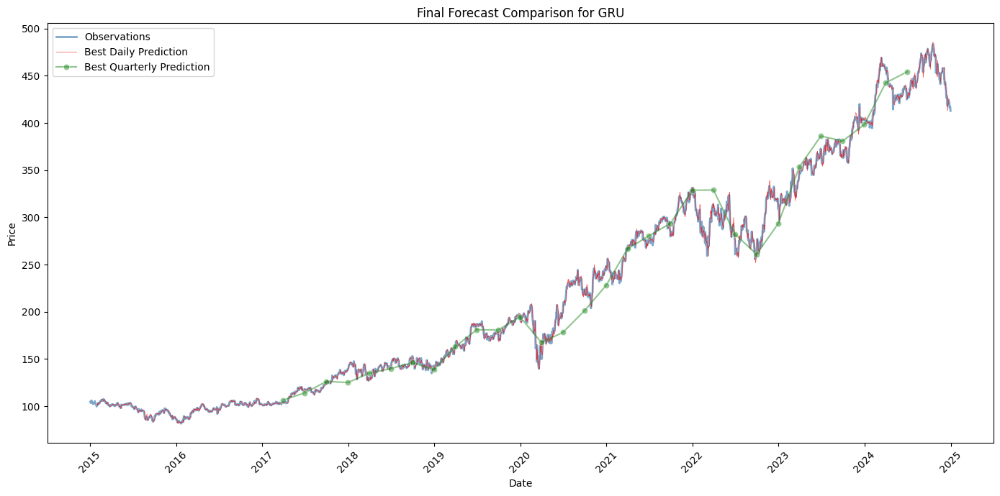

[INFO] Plotting MLP forecasts for SHW...


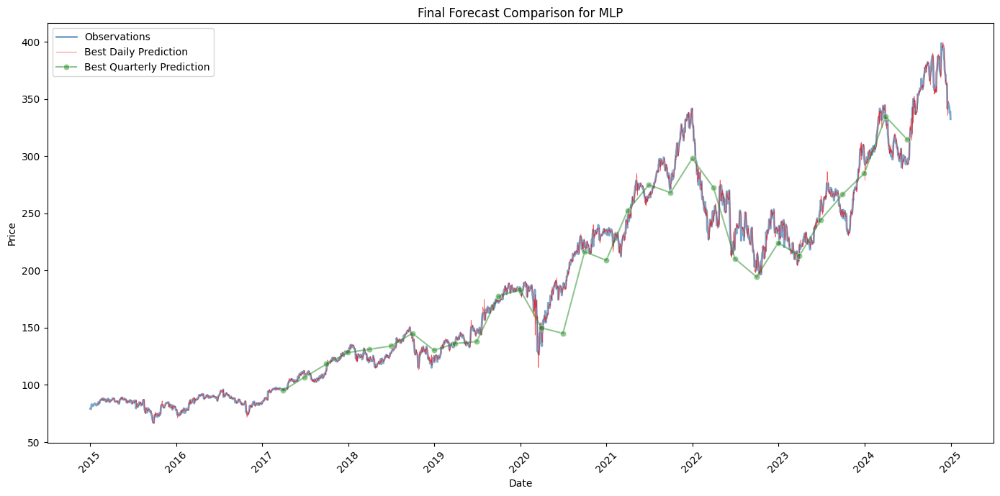

[INFO] Plotting RNN forecasts for SHW...


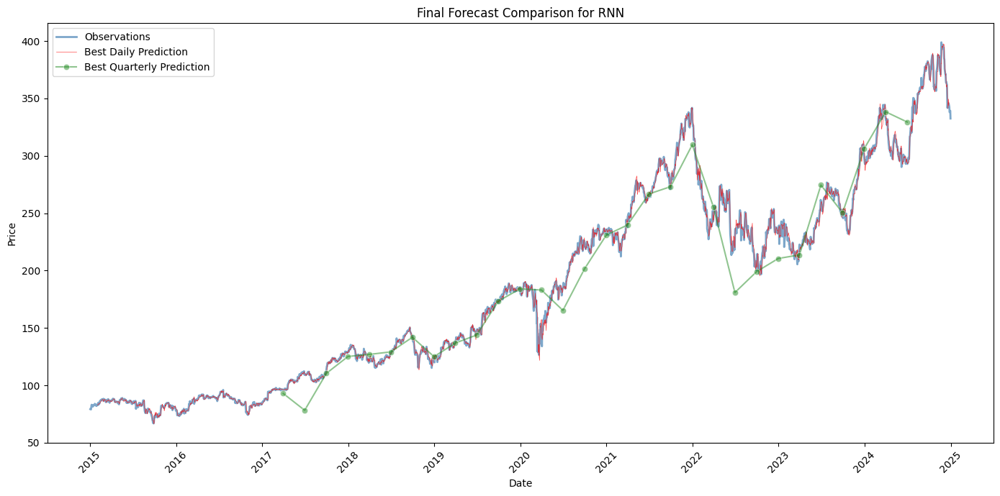

[INFO] Plotting LSTM forecasts for SHW...


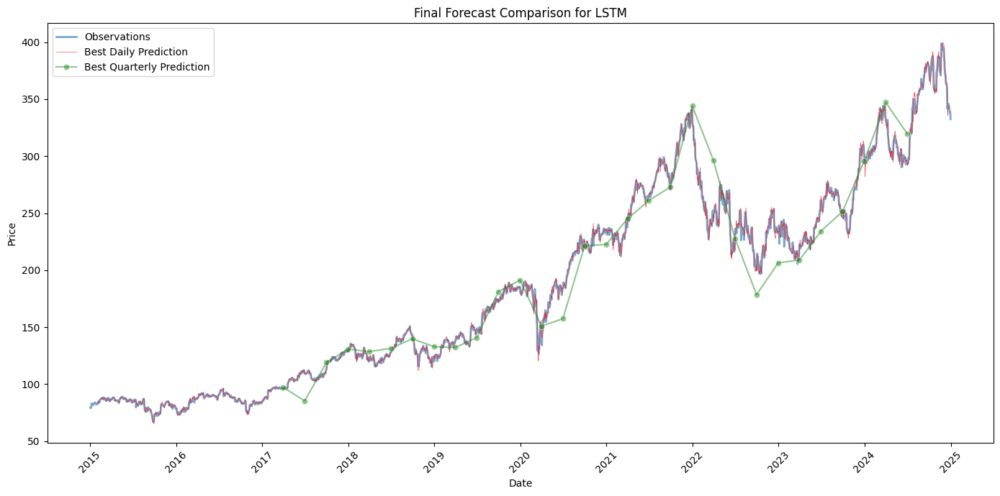

[INFO] Plotting GRU forecasts for SHW...


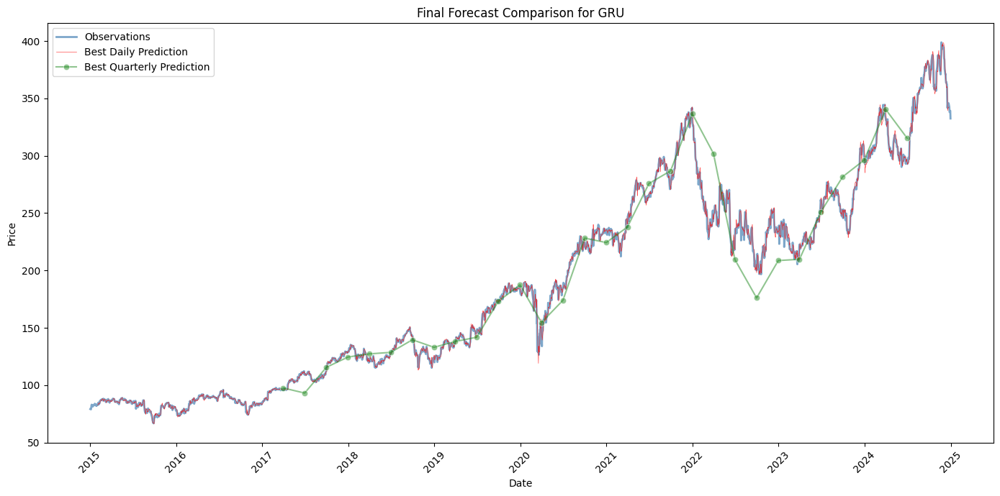

[INFO] Plotting MLP forecasts for AMT...


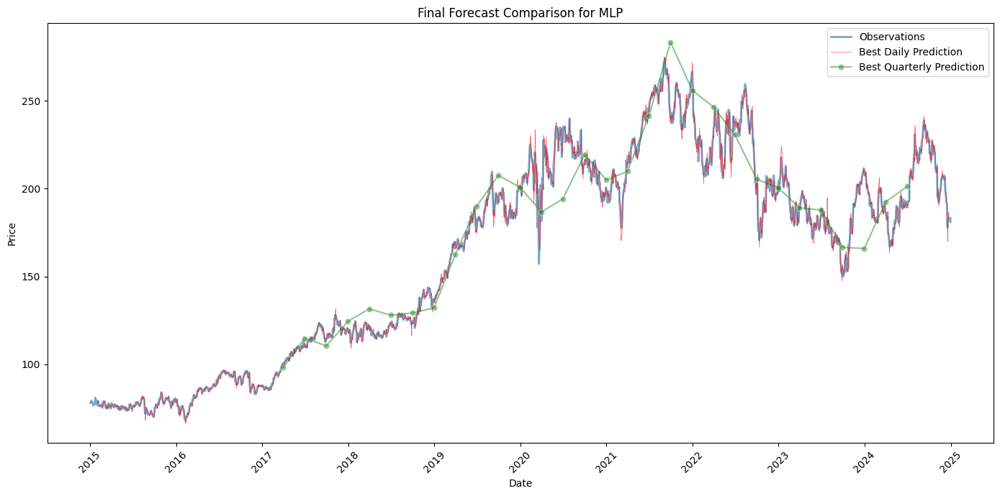

[INFO] Plotting RNN forecasts for AMT...


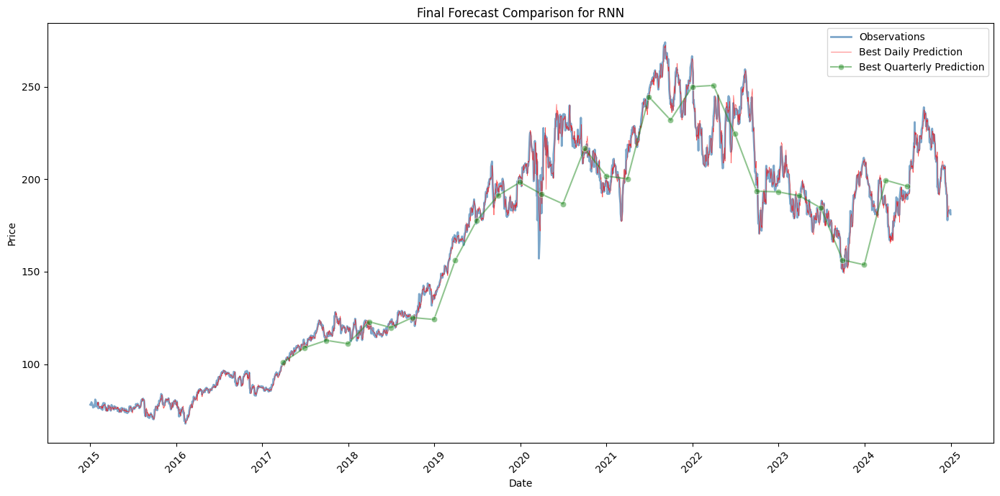

[INFO] Plotting LSTM forecasts for AMT...


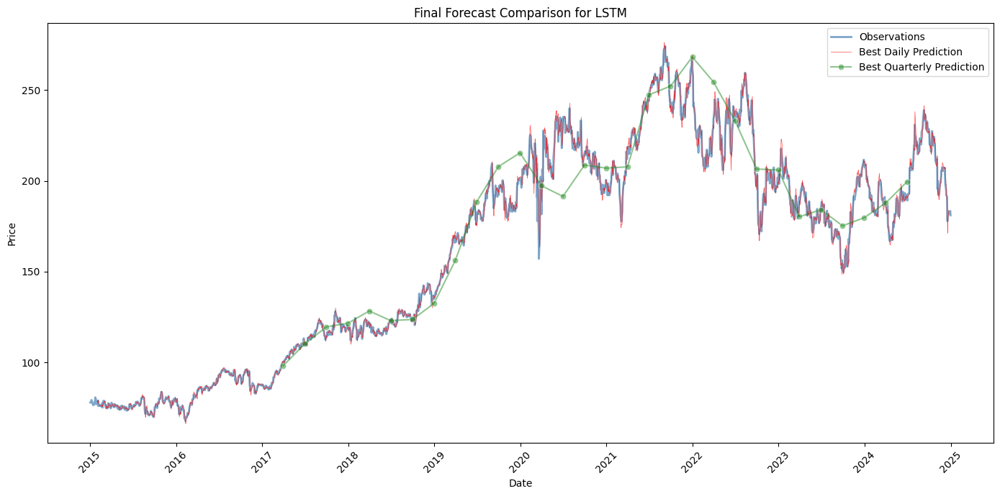

[INFO] Plotting GRU forecasts for AMT...


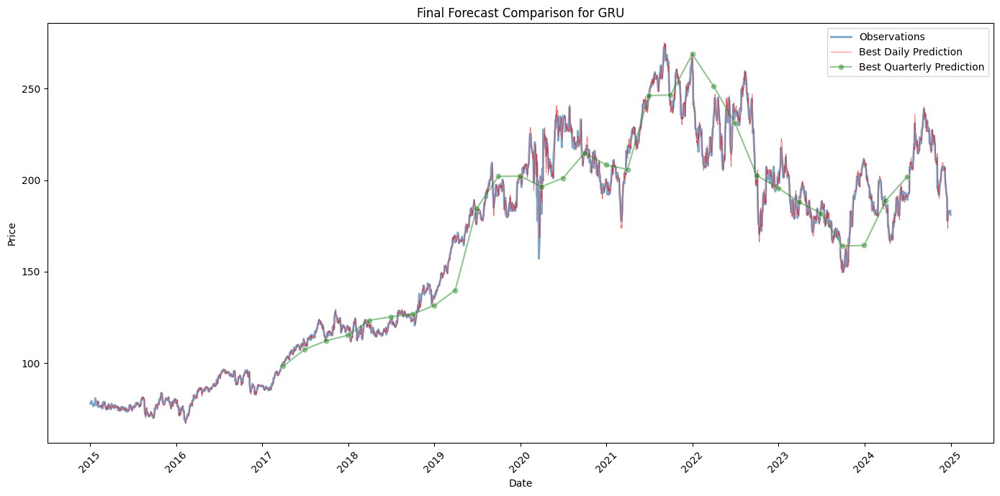

[INFO] Plotting MLP forecasts for PLD...


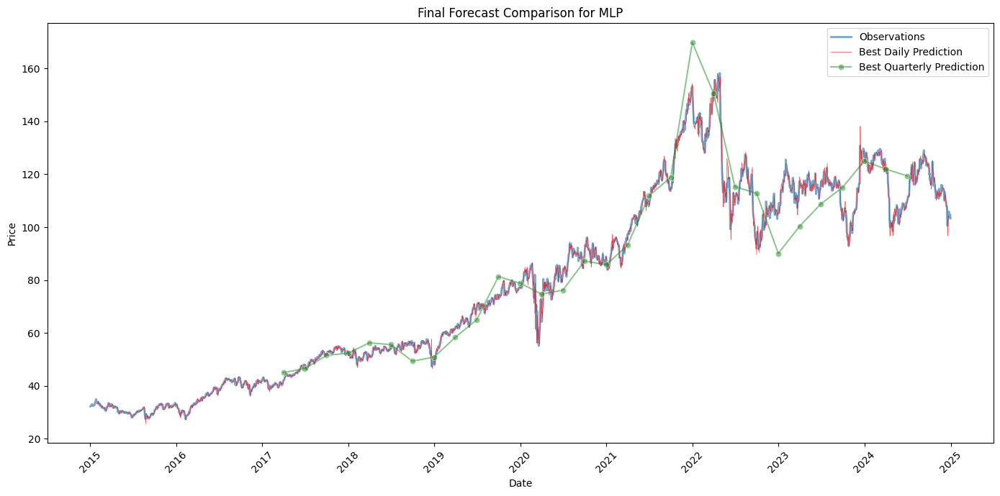

[INFO] Plotting RNN forecasts for PLD...


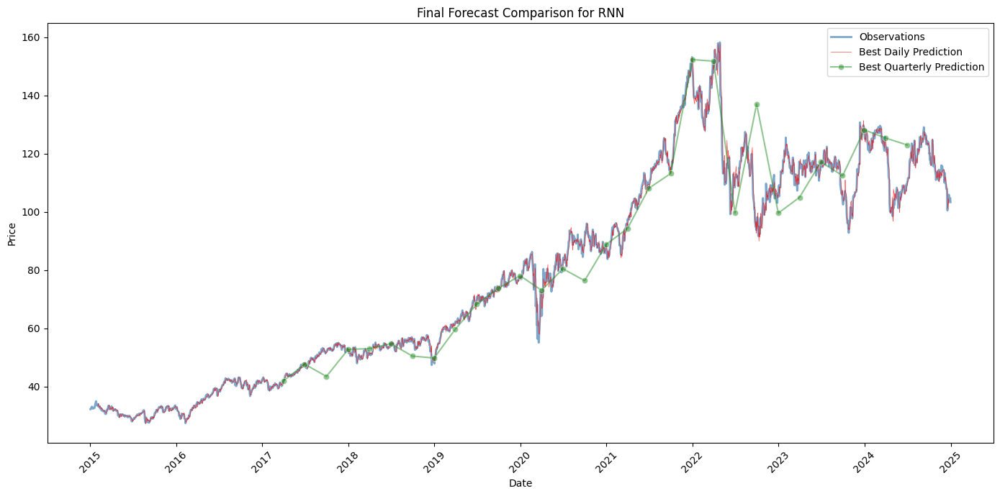

[INFO] Plotting LSTM forecasts for PLD...


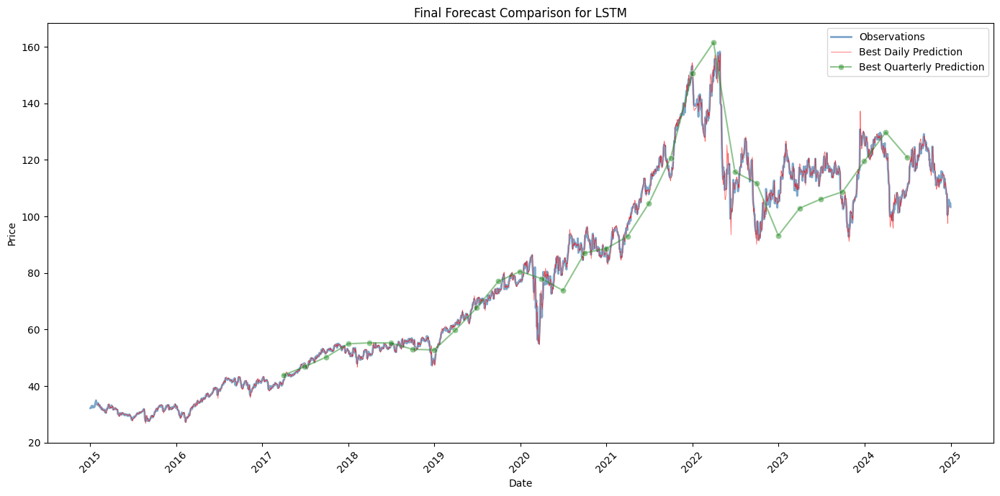

[INFO] Plotting GRU forecasts for PLD...


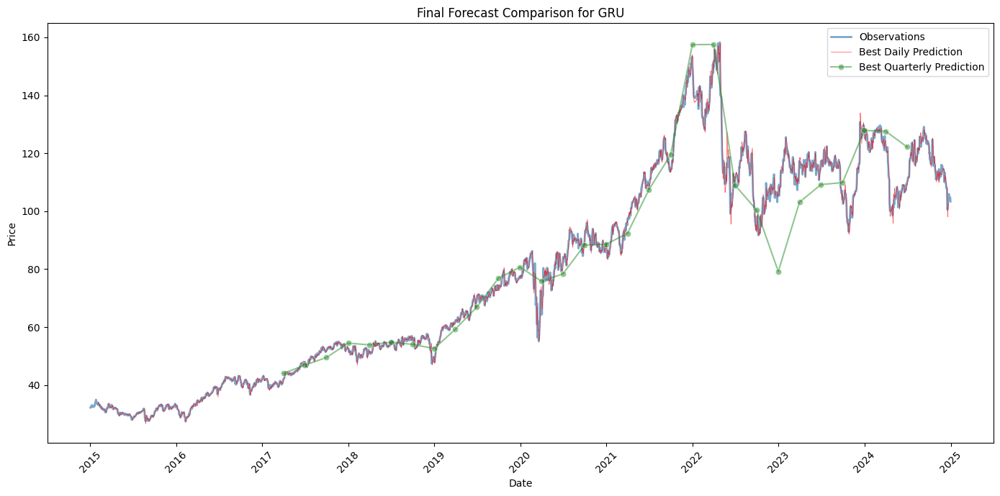

[INFO] Plotting MLP forecasts for NEE...


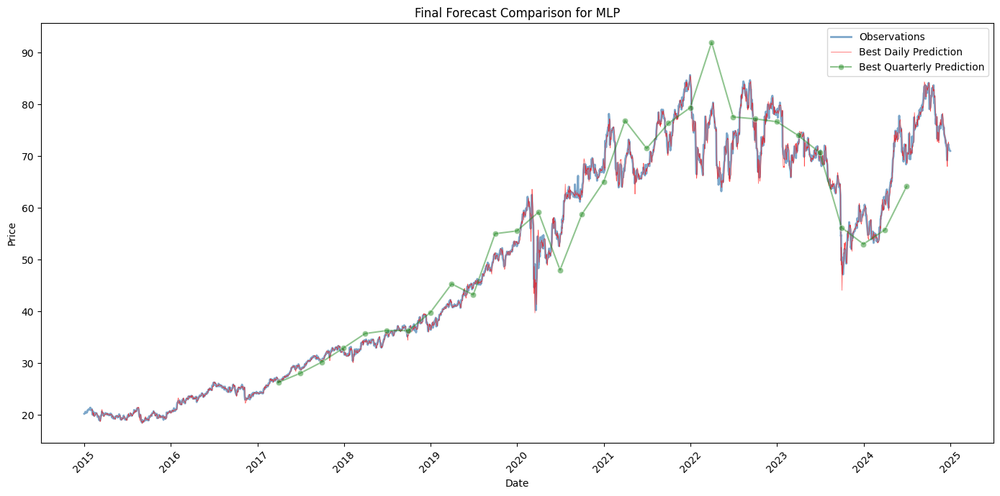

[INFO] Plotting RNN forecasts for NEE...


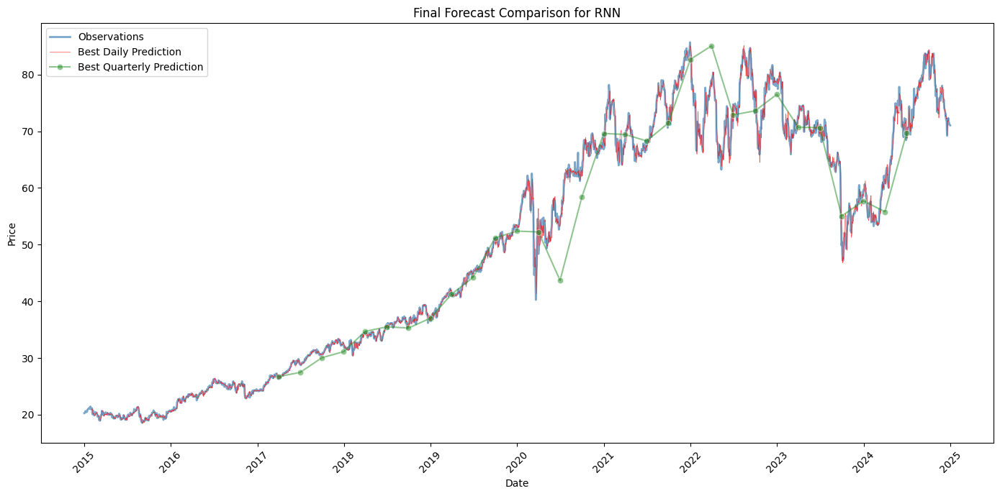

[INFO] Plotting LSTM forecasts for NEE...


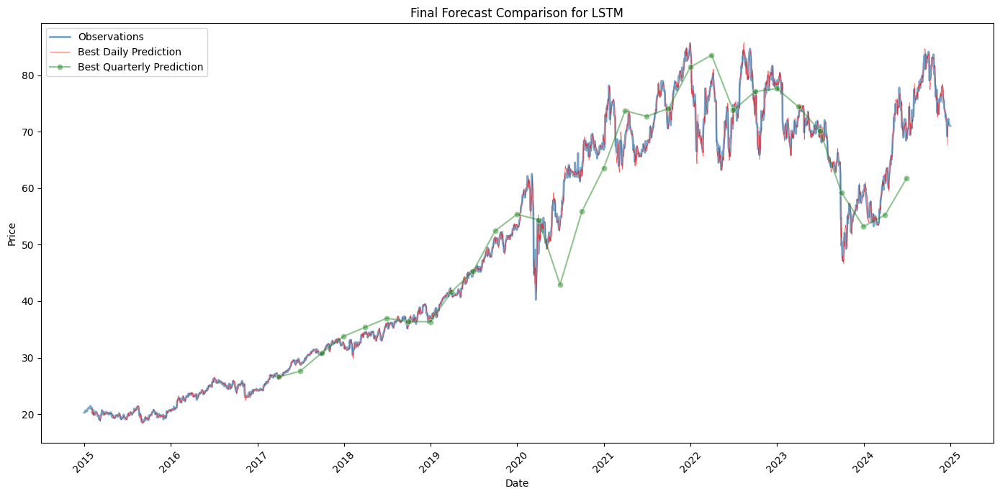

[INFO] Plotting GRU forecasts for NEE...


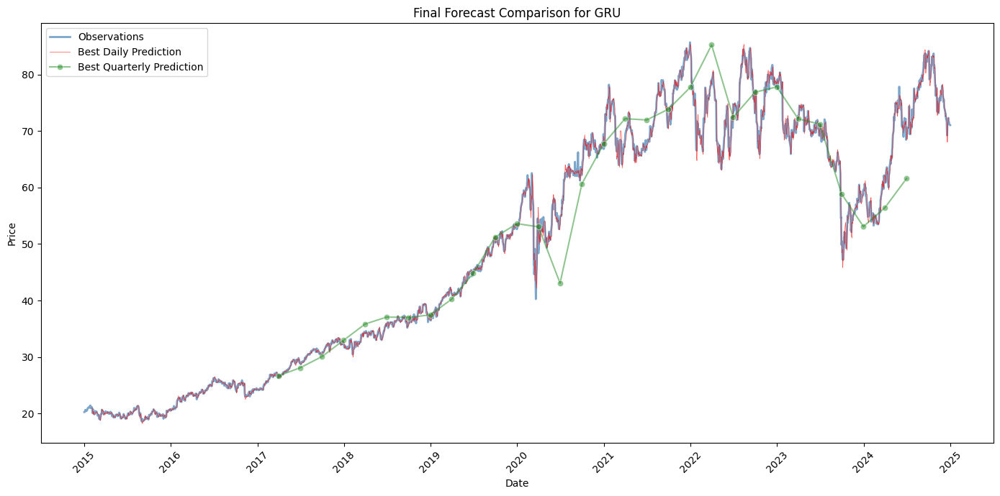

[INFO] Plotting MLP forecasts for SO...


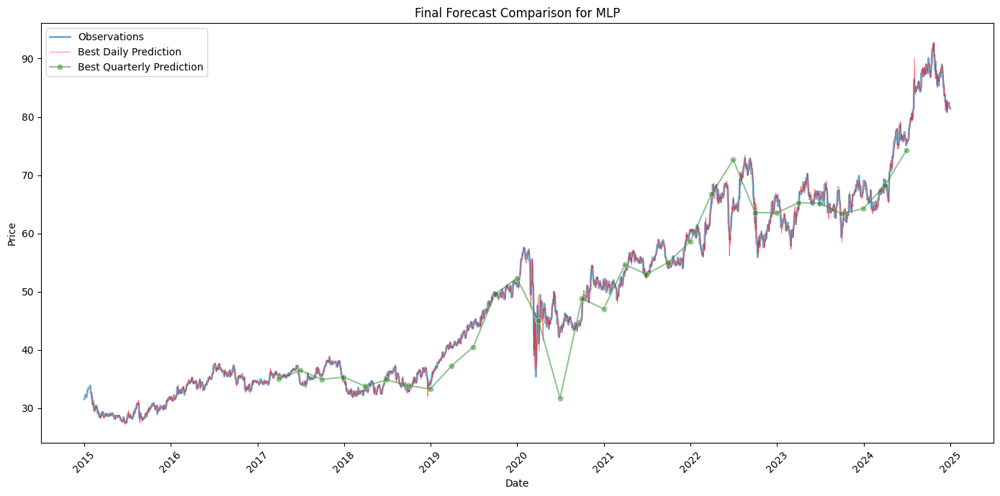

[INFO] Plotting RNN forecasts for SO...


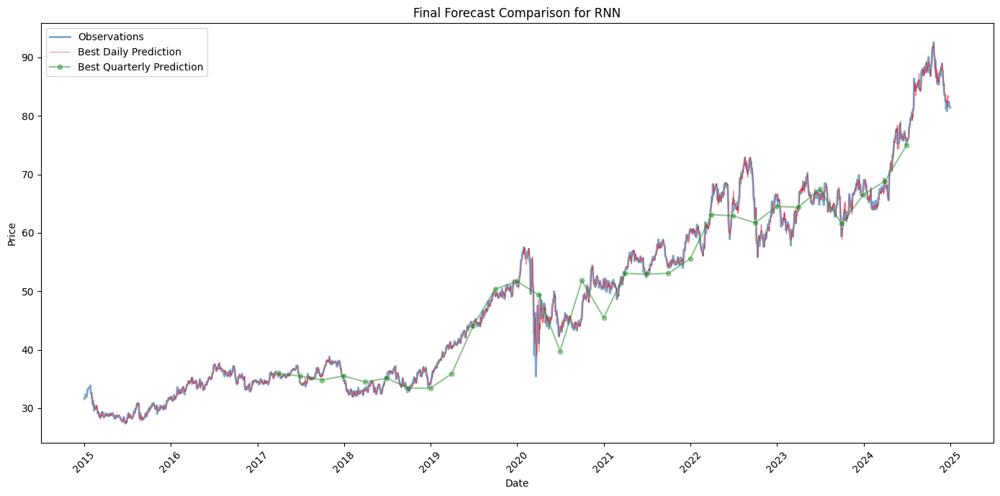

[INFO] Plotting LSTM forecasts for SO...


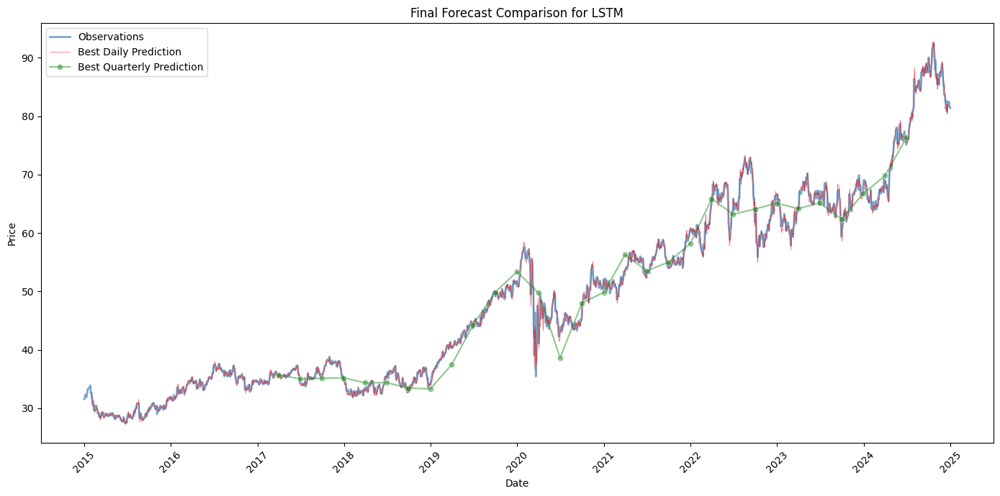

[INFO] Plotting GRU forecasts for SO...


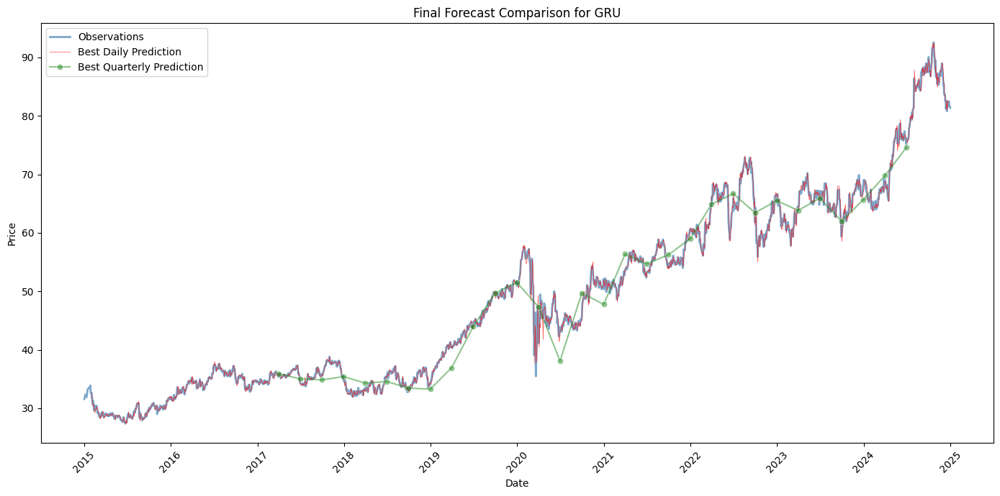

[INFO] Plotting MLP forecasts for ^GSPC...


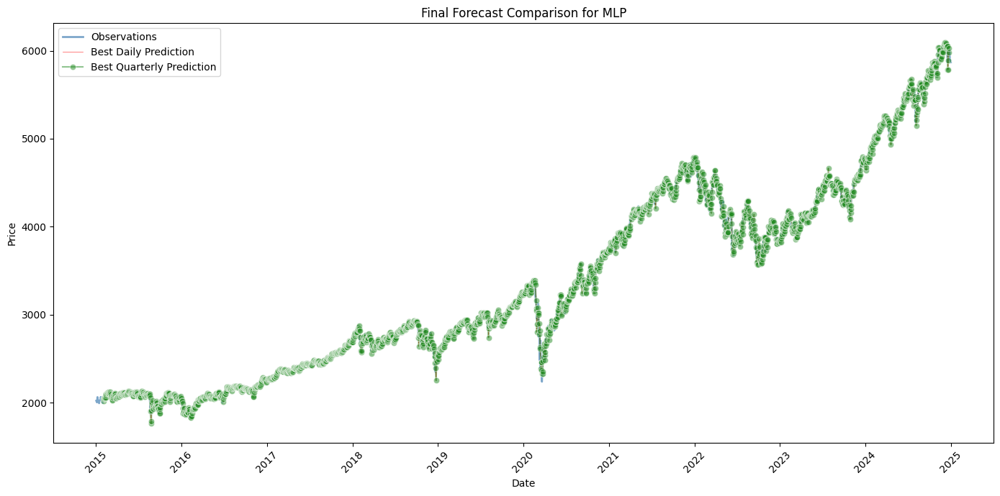

[INFO] Plotting RNN forecasts for ^GSPC...


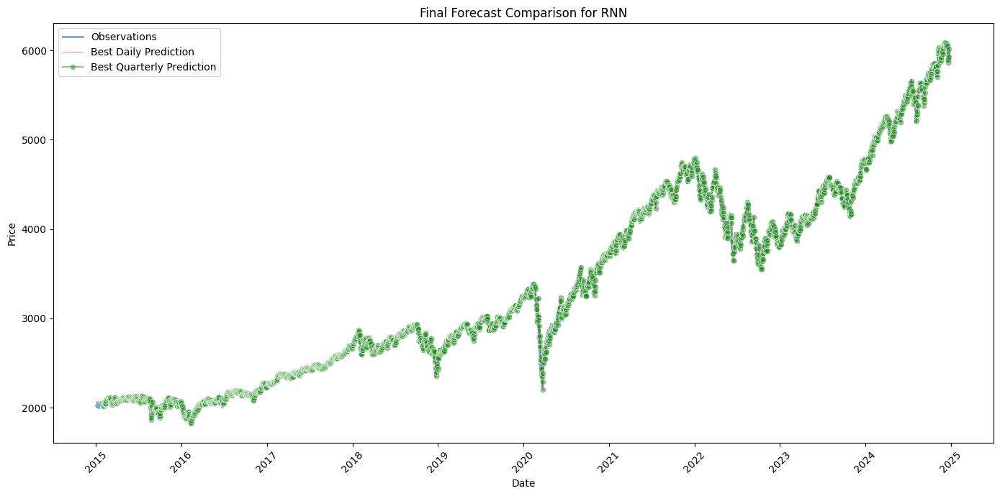

[INFO] Plotting LSTM forecasts for ^GSPC...


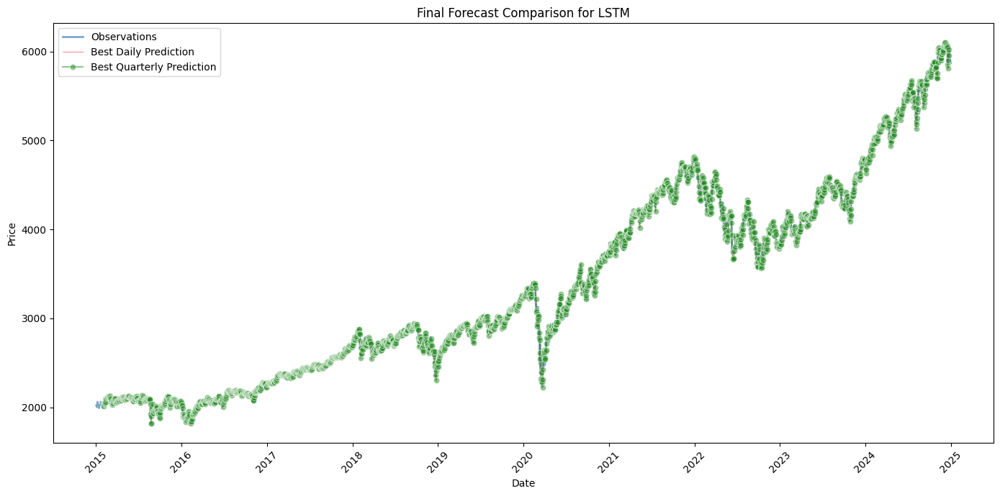

[INFO] Plotting GRU forecasts for ^GSPC...


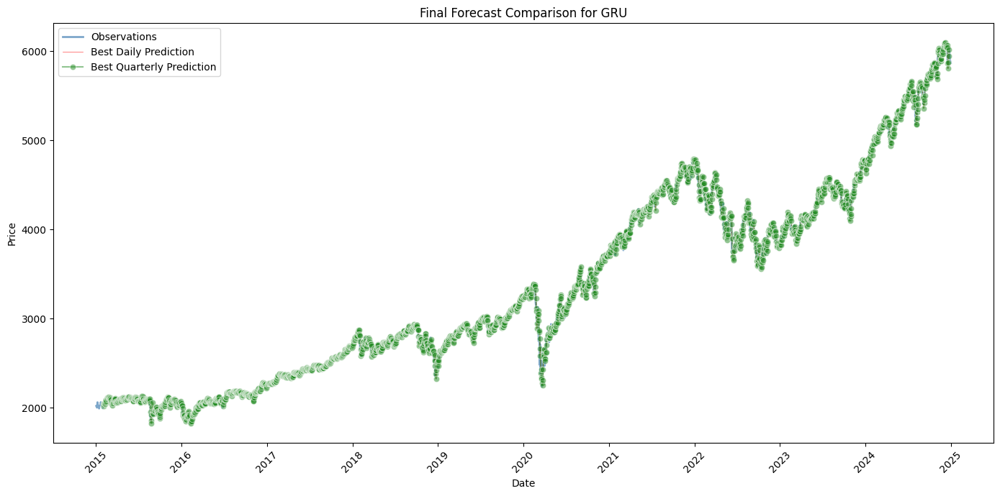

In [17]:
for ticker in daily_data_dict.keys():
    try:
        for m in MODEL_TYPES:
            print(f"[INFO] Plotting {m} forecasts for {ticker}...")

            # Get daily predictions and ensure the index is normalized
            daily_df = daily_data_dict[ticker]
            # If necessary, convert the daily DataFrame index to datetime and normalize
            daily_df.index = pd.to_datetime(daily_df.index).normalize()
            daily_pred_series = get_preds_from_log(ticker, "Daily", m, daily_df)
            
            # Initialize quarterly predictions as None
            quarterly_pred_series = None
            if ticker in quarterly_data_dict:
                # Convert quarterly DataFrame index to datetime and normalize
                quarterly_df = quarterly_data_dict[ticker]
                quarterly_df.index = pd.to_datetime(convert_quarter_index(quarterly_df)).normalize()
                quarterly_pred_series = get_preds_from_log(ticker, "Quarterly", m, quarterly_df)
            
            # Observations from daily data (as our base), and normalize its index
            obs = daily_df["y"]
            obs.index = pd.to_datetime(obs.index).normalize()
            
            # If quarterly predictions are not available, we default to daily predictions for both lines
            if quarterly_pred_series is None:
                quarterly_pred_series = daily_pred_series
            
            # Plot both series on one visual:
            final_line_plot(observations=obs, daily_preds=daily_pred_series, 
                            quarterly_preds=quarterly_pred_series, model_label=m)
    except Exception as e:
        print(f"[ERROR] Plotting failed for {ticker}: {e}")

In [18]:
daily_data_dict['AAPL']

,Adj Close,Close,High,Low,Open,Volume,SMA5,SMA50,SMA200,MACDLine,...,^IXIC,^DJI,^VIX,CL=F,GC=F,SI=F,^TNX,DX-Y.NYB,FedFundsRate,y
2015-01-02,24.320433,27.332500,27.860001,26.837500,27.847500,212818400,24.920158,24.811784,21.368268,-0.032423,...,4726.810059,17832.990234,17.790001,52.689999,1186.000000,15.734000,2.123,91.080002,0.12,23.635281
2015-01-05,23.635281,26.562500,27.162500,26.352501,27.072500,257142000,24.575804,24.828265,21.403677,-0.127245,...,4652.569824,17501.650391,19.920000,50.040001,1203.900024,16.179001,2.039,91.379997,0.12,23.637518
2015-01-06,23.637518,26.565001,26.857500,26.157499,26.635000,263188400,24.235457,24.836641,21.438444,-0.199907,...,4592.740234,17371.640625,21.120001,47.930000,1219.300049,16.603001,1.963,91.500000,0.12,23.968964
2015-01-07,23.968964,26.937500,27.049999,26.674999,26.799999,160423600,24.023241,24.849918,21.473879,-0.228118,...,4650.470215,17584.519531,19.309999,48.650002,1210.599976,16.510000,1.954,91.889999,0.12,24.889904
2015-01-08,24.889904,27.972500,28.037500,27.174999,27.307501,237458000,24.090420,24.882102,21.513011,-0.174156,...,4736.189941,17907.869141,17.010000,48.790001,1208.400024,16.351000,2.016,92.370003,0.12,24.916597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-24,257.916443,258.200012,258.209991,255.289993,255.490005,23234700,252.881967,235.564016,211.182570,6.067327,...,20031.130859,43297.031250,14.270000,70.099998,2620.000000,29.974001,4.591,108.260002,4.33,258.735504
2024-12-26,258.735504,259.019989,260.100006,257.630005,258.190002,27237100,255.073553,236.071997,211.614168,6.300019,...,20020.359375,43325.800781,14.730000,69.620003,2638.800049,30.047001,4.579,108.129997,4.33,255.309296
2024-12-27,255.309296,255.589996,258.700012,253.059998,257.829987,42355300,256.232281,236.552763,212.039086,6.137217,...,19722.029297,42992.210938,15.950000,70.599998,2617.199951,29.655001,4.619,108.000000,4.33,251.923019
2024-12-30,251.923019,252.199997,253.500000,250.750000,252.229996,35557500,255.774783,236.958419,212.437766,5.669595,...,19486.789062,42573.730469,17.400000,70.989998,2606.100098,29.106001,4.545,108.129997,4.33,250.144974


In [19]:
# Build summary DataFrames
daily_summary_df = pd.DataFrame.from_dict(daily_results, orient="index")
quarterly_summary_df = pd.DataFrame.from_dict(quarterly_results, orient="index")
daily_summary_df.loc["Total Average"] = daily_summary_df.mean(numeric_only=True)
quarterly_summary_df.loc["Total Average"] = quarterly_summary_df.mean(numeric_only=True)

print("\n[SUCCESS] Daily Performance Summary:")
display(daily_summary_df)
print("\n[SUCCESS] Quarterly Performance Summary:")
display(quarterly_summary_df)
print("\nOverall model performance summary printed above.")

# Optionally, save the summary tables to CSV files
daily_summary_df.to_csv(os.path.join("temp_output", "daily_performance_summary.csv"))
quarterly_summary_df.to_csv(os.path.join("temp_output", "quarterly_performance_summary.csv"))
print("[SUCCESS] Performance summaries saved to temp_output/")


[SUCCESS] Daily Performance Summary:


,Ticker,MLP_MSE,MLP_MAPE,MLP_R2,RNN_MSE,RNN_MAPE,RNN_R2,LSTM_MSE,LSTM_MAPE,LSTM_R2,GRU_MSE,GRU_MAPE,GRU_R2
AAPL,AAPL,5.191423,0.014746,0.998787,4.961929,0.014826,0.998841,4.862593,0.014536,0.998864,4.591429,0.014249,0.998927
MSFT,MSFT,16.057681,0.013603,0.998942,15.662075,0.013653,0.998968,16.283750,0.013621,0.998927,15.220477,0.013239,0.998997
LLY,LLY,53.704895,0.014169,0.998992,55.173039,0.014680,0.998965,53.781153,0.014118,0.998991,53.083589,0.013937,0.999004
UNH,UNH,39.500177,0.013140,0.998320,41.033690,0.013327,0.998255,39.280835,0.013085,0.998330,38.672475,0.012876,0.998355
V,V,10.298147,0.012186,0.997830,9.029748,0.012221,0.998097,8.696502,0.012036,0.998167,8.425208,0.011820,0.998225
MA,MA,28.488628,0.013211,0.998231,28.425591,0.013346,0.998235,27.307777,0.013047,0.998305,26.827741,0.012911,0.998335
GOOGL,GOOGL,4.014090,0.014811,0.997859,4.096605,0.014889,0.997814,4.081630,0.014997,0.997822,3.824728,0.014513,0.997960
META,META,45.407089,0.018490,0.996874,47.579774,0.019111,0.996724,43.616266,0.018532,0.996997,43.027788,0.018143,0.997038
AMZN,AMZN,7.675717,0.017162,0.997337,7.723919,0.017223,0.997320,7.464420,0.017074,0.997410,7.123869,0.016672,0.997528
TSLA,TSLA,52.864192,0.030226,0.995924,57.796893,0.031479,0.995544,51.937737,0.029871,0.995996,52.232762,0.029733,0.995973



[SUCCESS] Quarterly Performance Summary:


,Ticker,MLP_MSE,MLP_MAPE,MLP_R2,RNN_MSE,RNN_MAPE,RNN_R2,LSTM_MSE,LSTM_MAPE,LSTM_R2,GRU_MSE,GRU_MAPE,GRU_R2
AAPL,AAPL,4.326307e+02,0.137803,8.813147e-01,373.003088,0.136520,0.897673,410.562196,0.127290,0.887369,445.168742,0.128068,0.877875
MSFT,MSFT,1.198661e+03,0.103982,9.041289e-01,1086.927005,0.106071,0.913066,1077.901101,0.104951,0.913788,1199.843016,0.110514,0.904034
LLY,LLY,3.585667e+03,0.123244,9.354590e-01,4652.868559,0.117569,0.916250,2358.458571,0.101215,0.957548,3254.779689,0.090755,0.941415
UNH,UNH,1.343559e+03,0.082473,9.209680e-01,1176.895197,0.078072,0.930772,1096.590661,0.076994,0.935495,1129.146581,0.081904,0.933580
V,V,5.598646e+13,7315.782615,-2.152545e+10,352.504280,0.090218,0.864471,337.004870,0.085252,0.870430,325.316195,0.088324,0.874924
MA,MA,1.135932e+03,0.096477,8.825894e-01,1471.168472,0.108283,0.847939,1303.034959,0.096102,0.865318,1277.098939,0.101991,0.867998
GOOGL,GOOGL,2.239520e+02,0.116873,8.550806e-01,193.535809,0.111252,0.874763,244.993089,0.123426,0.841465,196.299902,0.109761,0.872974
META,META,1.841597e+14,14934.046776,-1.440036e+10,2617.920190,0.169507,0.795292,4223.047938,0.231065,0.669779,4704.101582,0.240366,0.632163
AMZN,AMZN,6.508410e+02,0.158701,6.372370e-01,424.100226,0.146510,0.763617,482.916861,0.142976,0.730834,374.391626,0.126541,0.791323
TSLA,TSLA,3.402127e+03,0.277100,7.373191e-01,2983.802374,0.255597,0.769618,3757.622021,0.290467,0.709871,3658.688359,0.283077,0.717510



Overall model performance summary printed above.
[SUCCESS] Performance summaries saved to temp_output/
